In [1]:
%matplotlib inline
import matplotlib as mlp
mlp.rcParams['figure.dpi'] = 150

# diasbling warning messages
import warnings
warnings.filterwarnings("ignore")

# notebook dependencies
import pandas as pd
pd.set_option('display.max_rows', None, 'display.max_columns', None)
import numpy as np

#visualizations
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style = "darkgrid")

# math modules
from math import sqrt
import math
import scipy.stats as stats

import acquire
import prepare

# sklearn data science library
from sklearn.experimental import enable_iterative_imputer
from sklearn.metrics import mean_squared_error
from scipy.stats.mstats import winsorize

from sklearn.impute import IterativeImputer
from sklearn.cluster import KMeans

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import silhouette_score

from sklearn.preprocessing import RobustScaler, StandardScaler, MinMaxScaler, PolynomialFeatures
from sklearn.linear_model import LinearRegression, LassoLars, TweedieRegressor, LogisticRegression


from sklearn.decomposition import PCA 
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import HistGradientBoostingClassifier

from sklearn.feature_selection import RFE
from sklearn.feature_selection import RFECV
from sklearn.model_selection import StratifiedKFold

In [2]:
# pull-in the data

df = acquire.get_bach_df()
df = prepare.clean_college_df(df)
df = prepare.clean_high_percentage_nulls(df)

df = prepare.obtain_target_variables(df)
df.head()

dataframe shape: (71901, 139)
dataframe shape: (71901, 117)
dataframe shape: (71422, 127)


,unit_id_institution,college_name,institution_control,state_post_code,zip_code,city,region_ipeds,title_IV_eligibility,pred_degree,pred_degree_0and4,degree_name,degree_code,major_code,major_name,branch_number,avg_net_price_public,avg_net_price_private,pub_fam_income_0_30000,private_fam_income_0_30000,program_fam_income_0_30000,other_fam_income_0_30000,pub_fam_income_30001_48000,private_fam_income_30001_48000,program_fam_income_30001_48000,other_fam_income_30001_48000,pub_fam_income_48001_75000,private_fam_income_48001_75000,program_fam_income_48001_75000,other_fam_income_48001_75000,pub_fam_income_75001_110000,private_fam_income_75001_110000,program_fam_income_75001_110000,other_fam_income_75001_110000,pub_fam_income_over_110000,private_fam_income_over_110000,program_fam_income_over_110000,other_fam_income_over_110000,full_time_net_tuition_revenue,off_campus_cost_of_attendace,on_campus_cost_of_attendace,admission_rate,graduate_number,ACT_score_mid,avg_sat_admitted,required_score,avg_faculty_salary,online_only,comp_rt_ft_150over_expected_time,comp_rt_ft_150over_expected_time_two_races,comp_rt_ft_150over_expected_time_native_american,comp_rt_ft_150over_expected_time_asian,comp_rt_ft_150over_expected_time_black,comp_rt_ft_150over_expected_time_hispanic,comp_rt_ft_150over_expected_time_non_resident,comp_rt_ft_150over_expected_time_unknown_race,comp_rt_ft_150over_expected_time_white,share_entering_students_first_ft,share_of_part_time,first_time_ft_student_retention,first_time_pt_student_retention,enrollment_share_two_races,enrollment_share_native_american,enrollment_share_asian,enrollment_share_black,enrollment_share_hispanic,enrollment_share_pac_islander,enrollment_share_non_resident,enrollment_share_unknown,enrollment_share_white,undergraduate_number_pell_grant_fedral_loan,med_debt_pell_students,median_debt_completed,median_debt_non_first_generation,median_debt_non_pell,fedral_loan_full_time_first_time_undergraduate,pell_grant_full_time_first_time_undergraduate,deg_percent_awarded_agriculture_operations,deg_percent_awarded_natural_resources,deg_percent_awarded_architecture,deg_percent_awarded_area_ethnic_cultural_gender,deg_percent_awarded_communication_journalism,deg_percent_awarded_communication_tech,deg_percent_awarded_computer_science,deg_percent_awarded_personal_culinary_services,deg_percent_awarded_education,deg_percent_awarded_engineering,deg_percent_awarded_engineering_tech,deg_percent_awarded_foreign_language_literatures,deg_percent_awarded_human_science,deg_percent_awarded_legal_profession,deg_percent_awarded_english_lang,deg_percent_awarded_general_studies,deg_percent_awarded_library_sciences,deg_percent_awarded_bio_sciences,deg_percent_awarded_mathematics,deg_percent_awarded_military_tech,deg_percent_awarded_intedisciplinary_studies,deg_percent_awarded_leisure_fitness,deg_percent_awarded_philosophy,deg_percent_awarded_theology,deg_percent_awarded_physical_sciences,deg_percent_awarded_science_tech,deg_percent_awarded_psychology,deg_percent_awarded_homeland_security,deg_percent_awarded_public_admin,deg_percent_awarded_social_sciences,deg_percent_awarded_construction_trades,deg_percent_awarded_mechanic_repair,deg_percent_awarded_precision_production,deg_percent_awarded_transportation_materials,deg_percent_awarded_visual_and_performing_arts,deg_percent_awarded_health,deg_percent_awarded_business_management,deg_percent_awarded_history,non_deg_seeking,avg_net_price,major_category,2017,2018,2019,Grand Total,roi_5yr,pct_roi_5yr,roi_10yr,pct_roi_10yr,roi_20yr,pct_roi_20yr
0,100654.0,Alabama A & M University,Public,AL,35762,Normal,5.0,1.0,3.0,3.0,Bachelors Degree,3,100,"Agriculture, General.",1.0,14444.0,0.0,375.0,NaN,NaN,NaN,113.0,NaN,NaN,NaN,61.0,NaN,NaN,NaN,27.0,NaN,NaN,NaN,16.0,NaN,NaN,NaN,7413.0,9128.0,9128.0,0.8986,963.0,18.0,957.0,1.0,7101.0,0.0,0.2685,0.2500,NaN,NaN,0.2681,0.25,NaN,0.3750,0.2500,0.8987,0.0587,0.6087,1.0000,0.0118,0.0022,0.0018,0.9120,0.0088,0.0016,0.007,0.0361,0.0186,5039.0,17500,33375,16421,10250,0.7143

In [3]:
# additional transformations

df = prepare.create_fam_income_columns(df)
df = prepare.impute_avg_net_price(df)
df = prepare.impute_debt(df)

# create regions column
df['us_region'] = df.apply(lambda row: prepare.label_states(row), axis=1)

df.head(3)

dataframe shape: (71422, 112)


,unit_id_institution,college_name,institution_control,state_post_code,zip_code,city,region_ipeds,title_IV_eligibility,pred_degree,pred_degree_0and4,degree_name,degree_code,major_code,major_name,branch_number,avg_net_price_public,avg_net_price_private,full_time_net_tuition_revenue,off_campus_cost_of_attendace,on_campus_cost_of_attendace,admission_rate,graduate_number,ACT_score_mid,avg_sat_admitted,required_score,avg_faculty_salary,online_only,comp_rt_ft_150over_expected_time,comp_rt_ft_150over_expected_time_two_races,comp_rt_ft_150over_expected_time_native_american,comp_rt_ft_150over_expected_time_asian,comp_rt_ft_150over_expected_time_black,comp_rt_ft_150over_expected_time_hispanic,comp_rt_ft_150over_expected_time_non_resident,comp_rt_ft_150over_expected_time_unknown_race,comp_rt_ft_150over_expected_time_white,share_entering_students_first_ft,share_of_part_time,first_time_ft_student_retention,first_time_pt_student_retention,enrollment_share_two_races,enrollment_share_native_american,enrollment_share_asian,enrollment_share_black,enrollment_share_hispanic,enrollment_share_pac_islander,enrollment_share_non_resident,enrollment_share_unknown,enrollment_share_white,undergraduate_number_pell_grant_fedral_loan,med_debt_pell_students,median_debt_completed,median_debt_non_first_generation,median_debt_non_pell,fedral_loan_full_time_first_time_undergraduate,pell_grant_full_time_first_time_undergraduate,deg_percent_awarded_agriculture_operations,deg_percent_awarded_natural_resources,deg_percent_awarded_architecture,deg_percent_awarded_area_ethnic_cultural_gender,deg_percent_awarded_communication_journalism,deg_percent_awarded_communication_tech,deg_percent_awarded_computer_science,deg_percent_awarded_personal_culinary_services,deg_percent_awarded_education,deg_percent_awarded_engineering,deg_percent_awarded_engineering_tech,deg_percent_awarded_foreign_language_literatures,deg_percent_awarded_human_science,deg_percent_awarded_legal_profession,deg_percent_awarded_english_lang,deg_percent_awarded_general_studies,deg_percent_awarded_library_sciences,deg_percent_awarded_bio_sciences,deg_percent_awarded_mathematics,deg_percent_awarded_military_tech,deg_percent_awarded_intedisciplinary_studies,deg_percent_awarded_leisure_fitness,deg_percent_awarded_philosophy,deg_percent_awarded_theology,deg_percent_awarded_physical_sciences,deg_percent_awarded_science_tech,deg_percent_awarded_psychology,deg_percent_awarded_homeland_security,deg_percent_awarded_public_admin,deg_percent_awarded_social_sciences,deg_percent_awarded_construction_trades,deg_percent_awarded_mechanic_repair,deg_percent_awarded_precision_production,deg_percent_awarded_transportation_materials,deg_percent_awarded_visual_and_performing_arts,deg_percent_awarded_health,deg_percent_awarded_business_management,deg_percent_awarded_history,non_deg_seeking,avg_net_price,major_category,2017,2018,2019,Grand Total,roi_5yr,pct_roi_5yr,roi_10yr,pct_roi_10yr,roi_20yr,pct_roi_20yr,income_0_30000,income_30001_48000,income_48001_75000,income_75001_110000,income_over_110000,us_region
0,100654.0,Alabama A & M University,Public,AL,35762,Normal,5.0,1.0,3.0,3.0,Bachelors Degree,3,100,"Agriculture, General.",1.0,14444.0,0.0,7413.0,9128.0,9128.0,0.8986,963.0,18.0,957.0,1.0,7101.0,0.0,0.2685,0.25,NaN,NaN,0.2681,0.25,NaN,0.3750,0.2500,0.8987,0.0587,0.6087,1.0000,0.0118,0.0022,0.0018,0.912,0.0088,0.0016,0.007,0.0361,0.0186,5039.0,17500,33375,16421,10250,0.7143,0.7057,0.0394,0.0237,0.0039,0.0,0.0000,0.0394,0.0592,0.0,0.0710,0.1183,0.0197,0.0000,0.0394,0.0,0.0158,0.0473,0.0,0.0927,0.0059,0.0,0.00,0.002,0.0000,0.0,0.0355,0.0,0.0631,0.0572,0.0493,0.0355,0.0,0.0,0.0,0.0000,0.0237,0.0000,0.1578,0.0000,153.0,14444.0,Agriculture,57605.6889,55517.8694,61388.9338,174512.4921,0.4062,40.6166,1.9900,198.9979,5.6693,566.9295,375.0,113.0,61.0,27.0,16.0,east_south_central
1,100654.0,Alabama A & M University,Public,AL,35762,Normal,5.0,1.0,3.0,3.0,Bachelors Degree,3,199,"Agriculture, Agriculture Operations, and Relat...",1.0,14444.0

In [4]:
# checking percentage of nulls across features
null_percentages = df.isnull().mean().round(2)

with pd.option_context('display.max_rows', None):
    print(null_percentages.sort_index().sort_values(ascending=False))

first_time_pt_student_retention                     0.34
comp_rt_ft_150over_expected_time_native_american    0.28
comp_rt_ft_150over_expected_time_unknown_race       0.19
comp_rt_ft_150over_expected_time_non_resident       0.19
graduate_number                                     0.17
comp_rt_ft_150over_expected_time_asian              0.16
comp_rt_ft_150over_expected_time_two_races          0.16
on_campus_cost_of_attendace                         0.14
required_score                                      0.14
non_deg_seeking                                     0.11
comp_rt_ft_150over_expected_time_black              0.09
comp_rt_ft_150over_expected_time_hispanic           0.09
comp_rt_ft_150over_expected_time_white              0.08
first_time_ft_student_retention                     0.08
off_campus_cost_of_attendace                        0.08
comp_rt_ft_150over_expected_time                    0.06
share_entering_students_first_ft                    0.06
pell_grant_full_time_first_time

----
### ``Initial Data Split``


In [5]:
# splitting the data

train, validate, test = prepare.split_data(df)

train shape: (39995, 113)
validate shape: (17142, 113)
test shape: (14285, 113)


In [6]:
# handle outliers in datasets

train = prepare.percentile_capping(train, 0.1, 0.1)
validate = prepare.percentile_capping(validate, 0.1, 0.1)
test = prepare.percentile_capping(test, 0.1, 0.1)

train.head(3)

,unit_id_institution,college_name,institution_control,state_post_code,zip_code,city,region_ipeds,title_IV_eligibility,pred_degree,pred_degree_0and4,degree_name,degree_code,major_code,major_name,branch_number,avg_net_price_public,avg_net_price_private,full_time_net_tuition_revenue,off_campus_cost_of_attendace,on_campus_cost_of_attendace,admission_rate,graduate_number,ACT_score_mid,avg_sat_admitted,required_score,avg_faculty_salary,online_only,comp_rt_ft_150over_expected_time,comp_rt_ft_150over_expected_time_two_races,comp_rt_ft_150over_expected_time_native_american,comp_rt_ft_150over_expected_time_asian,comp_rt_ft_150over_expected_time_black,comp_rt_ft_150over_expected_time_hispanic,comp_rt_ft_150over_expected_time_non_resident,comp_rt_ft_150over_expected_time_unknown_race,comp_rt_ft_150over_expected_time_white,share_entering_students_first_ft,share_of_part_time,first_time_ft_student_retention,first_time_pt_student_retention,enrollment_share_two_races,enrollment_share_native_american,enrollment_share_asian,enrollment_share_black,enrollment_share_hispanic,enrollment_share_pac_islander,enrollment_share_non_resident,enrollment_share_unknown,enrollment_share_white,undergraduate_number_pell_grant_fedral_loan,med_debt_pell_students,median_debt_completed,median_debt_non_first_generation,median_debt_non_pell,fedral_loan_full_time_first_time_undergraduate,pell_grant_full_time_first_time_undergraduate,deg_percent_awarded_agriculture_operations,deg_percent_awarded_natural_resources,deg_percent_awarded_architecture,deg_percent_awarded_area_ethnic_cultural_gender,deg_percent_awarded_communication_journalism,deg_percent_awarded_communication_tech,deg_percent_awarded_computer_science,deg_percent_awarded_personal_culinary_services,deg_percent_awarded_education,deg_percent_awarded_engineering,deg_percent_awarded_engineering_tech,deg_percent_awarded_foreign_language_literatures,deg_percent_awarded_human_science,deg_percent_awarded_legal_profession,deg_percent_awarded_english_lang,deg_percent_awarded_general_studies,deg_percent_awarded_library_sciences,deg_percent_awarded_bio_sciences,deg_percent_awarded_mathematics,deg_percent_awarded_military_tech,deg_percent_awarded_intedisciplinary_studies,deg_percent_awarded_leisure_fitness,deg_percent_awarded_philosophy,deg_percent_awarded_theology,deg_percent_awarded_physical_sciences,deg_percent_awarded_science_tech,deg_percent_awarded_psychology,deg_percent_awarded_homeland_security,deg_percent_awarded_public_admin,deg_percent_awarded_social_sciences,deg_percent_awarded_construction_trades,deg_percent_awarded_mechanic_repair,deg_percent_awarded_precision_production,deg_percent_awarded_transportation_materials,deg_percent_awarded_visual_and_performing_arts,deg_percent_awarded_health,deg_percent_awarded_business_management,deg_percent_awarded_history,non_deg_seeking,avg_net_price,major_category,2017,2018,2019,Grand Total,roi_5yr,pct_roi_5yr,roi_10yr,pct_roi_10yr,roi_20yr,pct_roi_20yr,income_0_30000,income_30001_48000,income_48001_75000,income_75001_110000,income_over_110000,us_region
25530,220862.0,University of Memphis,Public,TN,38152,Memphis,5.0,1.0,3.0,3.0,Bachelors Degree,3,1101,Journalism.,1.0,13048.0,0.0,7992.0,9975.0,9975.0,0.8430,4225.0,23.0,1133.0,1.0,8934.0,0.0,0.4780,0.4051,0.5000,0.7544,0.3585,0.5357,0.6471,0.5,0.5405,0.6227,0.2274,0.7611,0.5439,0.0398,0.0021,0.0364,0.3650,0.0563,0.0006,0.0170,0.0117,0.4703,17467.0,18500,25000,15062,12500,0.5540,0.5491,0.0000,0.0000,0.0029,0.0022,0.0481,0.0000,0.0099,0.0,0.0471,0.0430,0.0134,0.0127,0.0000,0.0,0.0248,0.0554,0.0,0.0258,0.0067,0.0,0.0811,0.0825,0.0022,0.0,0.0201,0.0,0.0542,0.0440,0.0245,0.0395,0.0,0.0,0.0,0.0,0.0347,0.1112,0.1816,0.0127,1670.0,13048.0,"English Language, Literature, and Composition",54382.3219,57100.3901,58348.5744,169831.2865,0.3913,39.1327,1.9370,193.7021,5.5278,552.7786,559.0,300.0,248.0,186.0,209.0,east_south_central
53875,218238.0,Limestone University,"Private, nonprofit",SC,29340-3799,Gaffney,5.0,1.0,3.0,3.0,Bachelors Degree,

In [7]:
# train and impute training dataset

train_imputed = prepare.train_iterative_imputer(train)

# check remaining nulls
remaining_nulls = train_imputed.isnull().sum()

with pd.option_context('display.max_rows', None):
    print(remaining_nulls.sort_index().sort_values(ascending = False))

median_debt_non_first_generation                    2262
2017                                                   0
major_code                                             0
institution_control                                    0
income_over_110000                                     0
income_75001_110000                                    0
income_48001_75000                                     0
income_30001_48000                                     0
income_0_30000                                         0
graduate_number                                        0
full_time_net_tuition_revenue                          0
first_time_pt_student_retention                        0
first_time_ft_student_retention                        0
fedral_loan_full_time_first_time_undergraduate         0
enrollment_share_white                                 0
enrollment_share_unknown                               0
enrollment_share_two_races                             0
enrollment_share_pac_islander  

In [8]:
# impute missing values in validate and test 

validate_imputed, test_imputed = prepare.impute_val_and_test(train, validate, test)
print(f'validate shape: {validate_imputed.shape}')
print(f'test shape: {test_imputed.shape}')

validate shape: (17142, 113)
test shape: (14285, 113)


-----
### ``Clustering Pre-processing``


In [9]:
# descriptive stats

summary_stats = train_imputed.describe().T
summary_stats["range"] = summary_stats["max"] -summary_stats["min"]

summary_stats.sort_index().sort_values(by = "range", ascending = False)

,count,mean,std,min,25%,50%,75%,max,range
Grand Total,39995.0,182400.891033,41884.366526,109223.675100,152359.807700,169831.286500,224509.212800,277838.885800,168615.210700
unit_id_institution,39995.0,187218.748619,36751.862178,128771.000000,154235.000000,192749.000000,217633.000000,238458.000000,109687.000000
2019,39995.0,63161.494375,14605.305457,31651.851800,53039.545100,58422.983900,79448.606100,100554.876100,68903.024300
2017,39995.0,58961.803782,13576.891557,37639.565200,49080.486200,54382.321900,72585.529500,97692.307700,60052.742500
2018,39995.0,60277.592870,13983.789970,35450.000000,50004.540900,56419.947600,72475.077300,91686.883900,56236.883900
avg_net_price,39995.0,19204.464233,7835.036048,-1133.000000,14336.000000,18783.000000,23536.000000,52062.000000,53195.000000
graduate_number,39995.0,3030.579354,4831.547777,-4886.980366,296.000000,1086.000000,3529.000000,42336.000000,47222.980366
median_debt_completed,39995.0,22717.313914,4522.127404,3500.000000,20500.000000,23250.000000,25988.000000,45881.000000,42381.000000
med_debt_pell_students,39995.0,17339.628379,4321.888136,3500.000000,14658.000000,17500.000000,20118.000000,35629.000000,32129.000000
avg_net_price_private,39995.0,12104.098762,12012.246071,0.000000,0.000000,13540.000000,23367.000000,29482.000000,29482.000000


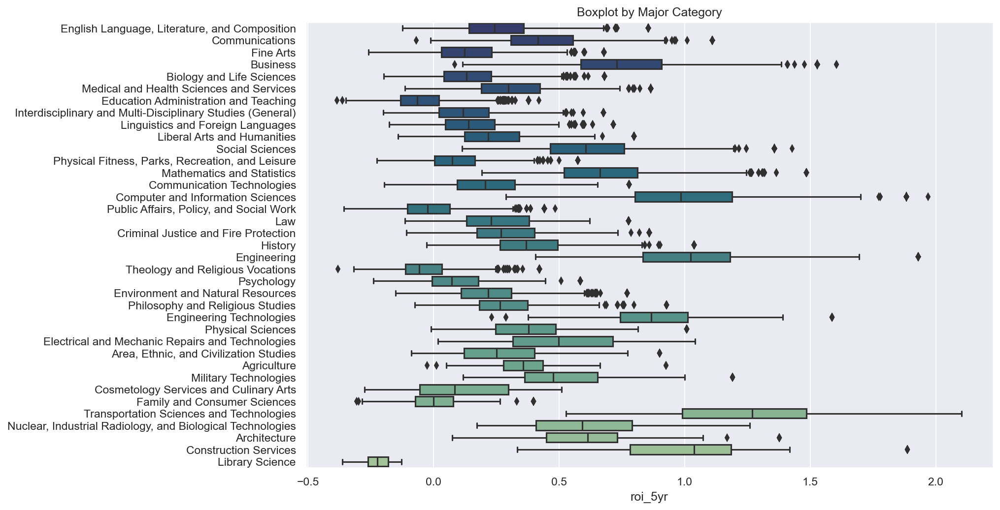

In [10]:
# central tendency at 5yr roi period by major

plt.figure(figsize = (12, 8))

sns.boxplot(
    x = "roi_5yr",
    y = "major_category",
    data = train_imputed,
    orient = "h",
    palette = "crest_r"
)

plt.title("Boxplot by Major Category")
plt.ylabel(None)
plt.show()

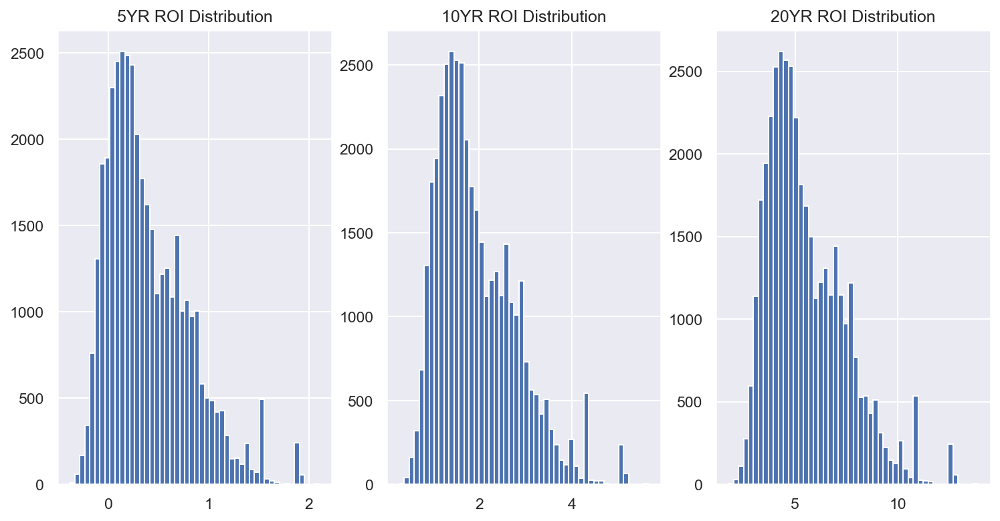

In [11]:
# side-by-side comparison of target variables

plt.subplots(nrows = 1, ncols = 2, figsize = (12, 6))

plt.subplot(131)
plt.title("5YR ROI Distribution")
plt.hist(train_imputed["roi_5yr"], bins = 50)

plt.subplot(132)
plt.title("10YR ROI Distribution")
plt.hist(train_imputed["roi_10yr"], bins = 50)

plt.subplot(133)
plt.title("20YR ROI Distribution")
plt.hist(train_imputed["roi_20yr"], bins = 50)

plt.show()

``additional variable creation``

In [12]:
# retrieve newly created "first-time, full-time student bins" column

train_imputed, validate_imputed, test_imputed = prepare.get_share_bins(train_imputed, validate_imputed, test_imputed)

train shape: (39995, 116)
validate shape: (17142, 116)
test shape: (14285, 116)


``Creating Dummy Variables``

In [13]:
# create dummy datasets w/passed categorical columns

train_dummy, validate_dummy, test_dummy = prepare.get_dummy_dataframes(train_imputed, validate_imputed, test_imputed)

train shape: (39995, 173)
validate shape: (17142, 173)
test shape: (14285, 173)


``Scale Continuous Variables``

In [14]:
# identify continuous variables to scale - exclusive of target variables

cont_lst = train_dummy.select_dtypes(exclude = ["object", "category", "uint8", "int64", "bool"]).columns.tolist()

target_lst = [ 
        "roi_5yr",
        "roi_10yr",
        "roi_20yr",
        "pct_roi_5yr",
        "pct_roi_10yr",
        "pct_roi_20yr",
        "2017",                                               
        "2018",                                                   
        "2019",
        "Grand Total",
        "avg_net_price"
        ]

# final continuous variables list
cont_lst = [col for col in cont_lst if col not in target_lst]

In [15]:
# transform datasets

scaler = RobustScaler()

# fit scaled on training dataset
scaler.fit(train_dummy[cont_lst])

# transform dummy datasets
train_dummy[cont_lst] = scaler.transform(train_dummy[cont_lst])
validate_dummy[cont_lst] = scaler.transform(validate_dummy[cont_lst])
test_dummy[cont_lst] = scaler.transform(test_dummy[cont_lst])

# give new dataframe names
train_scaled = train_dummy
validate_scaled = validate_dummy
test_scaled = test_dummy

# non-dummy datasets (can be used for future comparison purposes)
train_imputed[cont_lst] = scaler.transform(train_imputed[cont_lst])
validate_imputed[cont_lst] = scaler.transform(validate_imputed[cont_lst])
test_imputed[cont_lst] = scaler.transform(test_imputed[cont_lst])

# inspect the dataset
train_scaled.head() # checks out!

,unit_id_institution,college_name,state_post_code,zip_code,city,region_ipeds,title_IV_eligibility,pred_degree,pred_degree_0and4,degree_name,degree_code,major_code,major_name,branch_number,avg_net_price_public,avg_net_price_private,full_time_net_tuition_revenue,off_campus_cost_of_attendace,on_campus_cost_of_attendace,admission_rate,graduate_number,ACT_score_mid,avg_sat_admitted,required_score,avg_faculty_salary,online_only,comp_rt_ft_150over_expected_time,comp_rt_ft_150over_expected_time_two_races,comp_rt_ft_150over_expected_time_native_american,comp_rt_ft_150over_expected_time_asian,comp_rt_ft_150over_expected_time_black,comp_rt_ft_150over_expected_time_hispanic,comp_rt_ft_150over_expected_time_non_resident,comp_rt_ft_150over_expected_time_unknown_race,comp_rt_ft_150over_expected_time_white,share_entering_students_first_ft,share_of_part_time,first_time_ft_student_retention,first_time_pt_student_retention,enrollment_share_two_races,enrollment_share_native_american,enrollment_share_asian,enrollment_share_black,enrollment_share_hispanic,enrollment_share_pac_islander,enrollment_share_non_resident,enrollment_share_unknown,enrollment_share_white,undergraduate_number_pell_grant_fedral_loan,med_debt_pell_students,median_debt_completed,median_debt_non_first_generation,median_debt_non_pell,fedral_loan_full_time_first_time_undergraduate,pell_grant_full_time_first_time_undergraduate,deg_percent_awarded_agriculture_operations,deg_percent_awarded_natural_resources,deg_percent_awarded_architecture,deg_percent_awarded_area_ethnic_cultural_gender,deg_percent_awarded_communication_journalism,deg_percent_awarded_communication_tech,deg_percent_awarded_computer_science,deg_percent_awarded_personal_culinary_services,deg_percent_awarded_education,deg_percent_awarded_engineering,deg_percent_awarded_engineering_tech,deg_percent_awarded_foreign_language_literatures,deg_percent_awarded_human_science,deg_percent_awarded_legal_profession,deg_percent_awarded_english_lang,deg_percent_awarded_general_studies,deg_percent_awarded_library_sciences,deg_percent_awarded_bio_sciences,deg_percent_awarded_mathematics,deg_percent_awarded_military_tech,deg_percent_awarded_intedisciplinary_studies,deg_percent_awarded_leisure_fitness,deg_percent_awarded_philosophy,deg_percent_awarded_theology,deg_percent_awarded_physical_sciences,deg_percent_awarded_science_tech,deg_percent_awarded_psychology,deg_percent_awarded_homeland_security,deg_percent_awarded_public_admin,deg_percent_awarded_social_sciences,deg_percent_awarded_construction_trades,deg_percent_awarded_mechanic_repair,deg_percent_awarded_precision_production,deg_percent_awarded_transportation_materials,deg_percent_awarded_visual_and_performing_arts,deg_percent_awarded_health,deg_percent_awarded_business_management,deg_percent_awarded_history,non_deg_seeking,avg_net_price,2017,2018,2019,Grand Total,roi_5yr,pct_roi_5yr,roi_10yr,pct_roi_10yr,roi_20yr,pct_roi_20yr,income_0_30000,income_30001_48000,income_48001_75000,income_75001_110000,income_over_110000,major_category_Agriculture,major_category_Architecture,"major_category_Area, Ethnic, and Civilization Studies",major_category_Biology and Life Sciences,major_category_Business,major_category_Communication Technologies,major_category_Communications,major_category_Computer and Information Sciences,major_category_Construction Services,major_category_Cosmetology Services and Culinary Arts,major_category_Criminal Justice and Fire Protection,major_category_Education Administration and Teaching,major_category_Electrical and Mechanic Repairs and Technologies,major_category_Engineering,major_category_Engineering Technologies,"major_category_English Language, Literature, and Composition",major_category_Environment and Natural Resources,major_category_Family and Consumer Sciences,major_category_Fine Arts,major_category_History,major_category_Interdisciplinary and Multi-Disciplinary Studies (General),major_category_Law,major_category_Liberal Arts and Humanities,major_category_Librar

----
### ``Cluster Number 1: Admission Rate Cluster``


In [16]:
# setting features to cluster on 

X_admission = train_scaled[[
'income_48001_75000',
'admission_rate_binned_very_competitive',	
'admission_rate_binned_somewhat_competitive',	
'admission_rate_binned_competitive',	
'admission_rate_binned_average_acceptance',	
'admission_rate_binned_above_average_acceptance'
    ]]

# validate df
X_val = validate_scaled[[
'income_48001_75000',
'admission_rate_binned_very_competitive',	
'admission_rate_binned_somewhat_competitive',	
'admission_rate_binned_competitive',	
'admission_rate_binned_average_acceptance',	
'admission_rate_binned_above_average_acceptance'
    ]]

# test df
X_test = test_scaled[[
'income_48001_75000',
'admission_rate_binned_very_competitive',	
'admission_rate_binned_somewhat_competitive',	
'admission_rate_binned_competitive',	
'admission_rate_binned_average_acceptance',	
'admission_rate_binned_above_average_acceptance'
    ]]

X_admission.head()

,income_48001_75000,admission_rate_binned_very_competitive,admission_rate_binned_somewhat_competitive,admission_rate_binned_competitive,admission_rate_binned_average_acceptance,admission_rate_binned_above_average_acceptance
25530,1.429688,False,False,False,False,True
53875,-0.062500,True,False,False,False,False
42932,1.859375,False,False,False,True,False
45495,-0.218750,False,False,False,True,False
25003,-0.242188,False,True,False,False,False


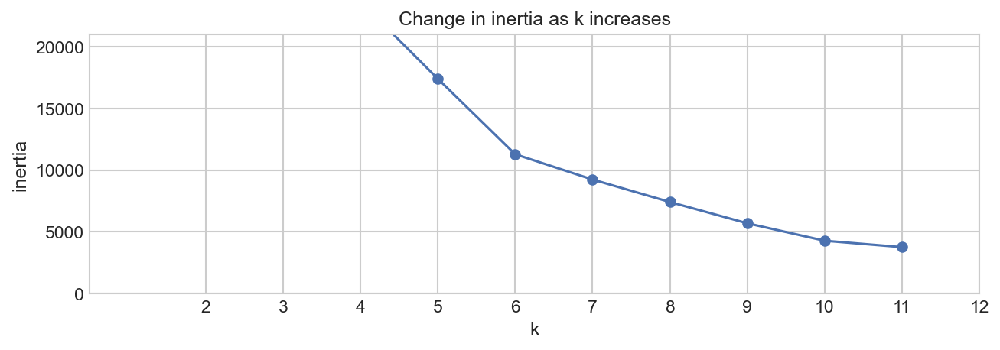

In [17]:
# KMeans Elbow-method

with plt.style.context('seaborn-whitegrid'):

    plt.figure(figsize=(10, 3))
    pd.Series({k: KMeans(k).fit(X_admission).inertia_ for k in range(1, 12)}).plot(marker = 'o')
    plt.xticks(range(2, 13))
    
    plt.ylim(0, 21000)
    plt.xlabel('k')
    plt.ylabel('inertia')
    plt.title('Change in inertia as k increases')

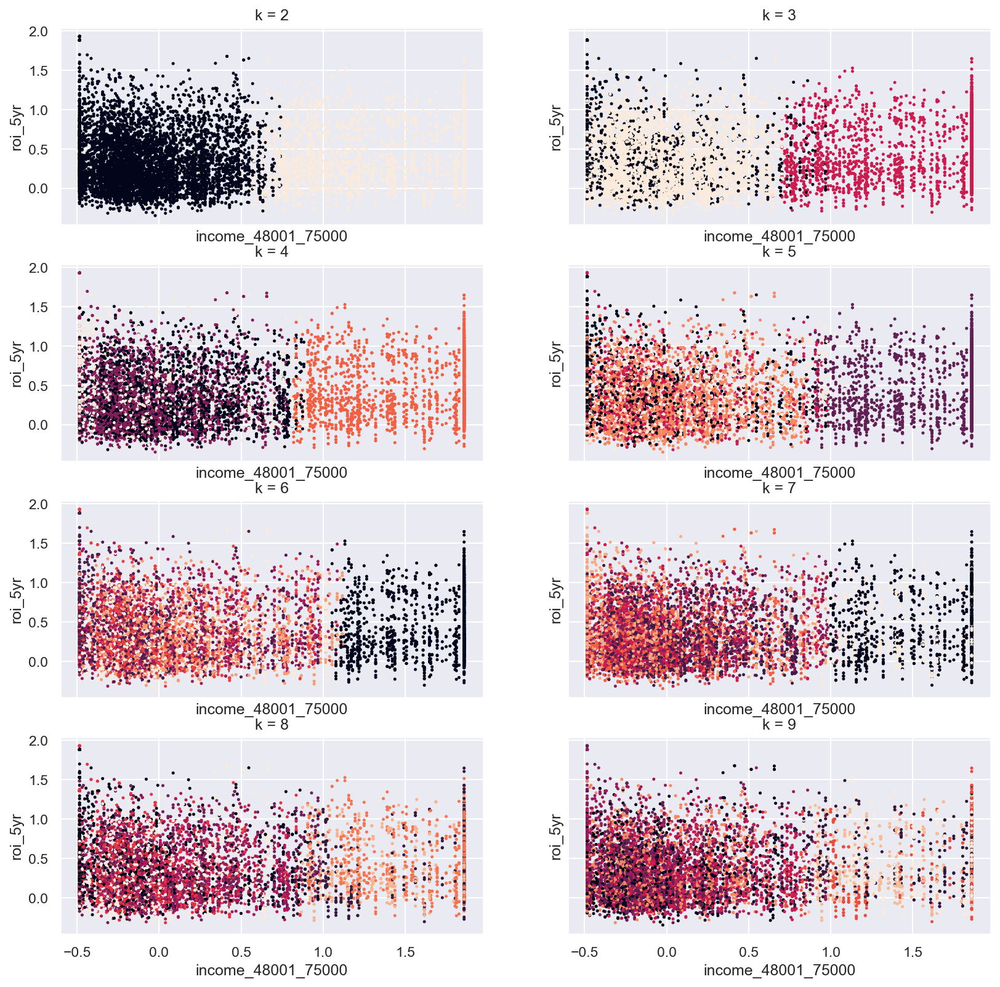

In [18]:
# plotting inertia for number of KMeans clusters

fig, axs = plt.subplots(4, 2, figsize=(13, 13), sharex=True, sharey=True)

for ax, k in zip(axs.ravel(), range(2, 13)):
    
    X1 = X_admission.sample(10000, random_state = 123)

    # creating and fitting KMeans
    clusters = KMeans(k).fit(X1).predict(X1)

    X1["roi_5yr"] = train_scaled["roi_5yr"]

    ax.scatter(
        X1["income_48001_75000"],
        X1["roi_5yr"],
        c = clusters,
        s = 2)

    ax.set(title='k = {}'.format(k), xlabel = 'income_48001_75000', ylabel = 'roi_5yr')

In [19]:
# measure correlation

ref_coeff = 0

for n_cluster in range(2, 11):

    kmeans = KMeans(n_clusters = n_cluster).fit(X1)

    label = kmeans.labels_

    sil_coeff = silhouette_score(X1, label, metric='euclidean')
    rel_coeff = (sil_coeff - ref_coeff)/ref_coeff
    ref_coeff = sil_coeff
    
    print("For n_clusters = {}, The Relative Silhouette Coefficient is {:.4f} and relative difference of {:.3f}".format(n_cluster, sil_coeff, rel_coeff))

For n_clusters = 2, The Relative Silhouette Coefficient is 0.3157 and relative difference of inf
For n_clusters = 3, The Relative Silhouette Coefficient is 0.2713 and relative difference of -0.141
For n_clusters = 4, The Relative Silhouette Coefficient is 0.3413 and relative difference of 0.258
For n_clusters = 5, The Relative Silhouette Coefficient is 0.4204 and relative difference of 0.232
For n_clusters = 6, The Relative Silhouette Coefficient is 0.4975 and relative difference of 0.183
For n_clusters = 7, The Relative Silhouette Coefficient is 0.5013 and relative difference of 0.008
For n_clusters = 8, The Relative Silhouette Coefficient is 0.5220 and relative difference of 0.041
For n_clusters = 9, The Relative Silhouette Coefficient is 0.5378 and relative difference of 0.030
For n_clusters = 10, The Relative Silhouette Coefficient is 0.5277 and relative difference of -0.019


In [20]:
# initial fitting of KMeans cluster

kmeans = KMeans(n_clusters = 5)
kmeans.fit(X_admission)

train_clusters = kmeans.predict(X_admission)

In [21]:
# creating cluster for ea. dataset 

train_admission_clusters = kmeans.predict(X_admission)
val_admission_clusters = kmeans.predict(X_val)
test_admission_clusters = kmeans.predict(X_test)

# viewing cluster samples
pd.DataFrame(train_admission_clusters).rename(columns = {0: "Cluster Sample"}).sample(10, random_state = 123)

,Cluster Sample
21417,0
28667,3
7477,4
24935,3
24966,4
7142,4
30603,3
7930,1
31203,3
1107,4


In [22]:
# adding clusters back to original datasets

train_scaled["admission_clusters_5yr"] = train_admission_clusters
validate_scaled["admission_clusters_5yr"] = val_admission_clusters
test_scaled["admission_clusters_5yr"] = test_admission_clusters

train_scaled.head()

,unit_id_institution,college_name,state_post_code,zip_code,city,region_ipeds,title_IV_eligibility,pred_degree,pred_degree_0and4,degree_name,degree_code,major_code,major_name,branch_number,avg_net_price_public,avg_net_price_private,full_time_net_tuition_revenue,off_campus_cost_of_attendace,on_campus_cost_of_attendace,admission_rate,graduate_number,ACT_score_mid,avg_sat_admitted,required_score,avg_faculty_salary,online_only,comp_rt_ft_150over_expected_time,comp_rt_ft_150over_expected_time_two_races,comp_rt_ft_150over_expected_time_native_american,comp_rt_ft_150over_expected_time_asian,comp_rt_ft_150over_expected_time_black,comp_rt_ft_150over_expected_time_hispanic,comp_rt_ft_150over_expected_time_non_resident,comp_rt_ft_150over_expected_time_unknown_race,comp_rt_ft_150over_expected_time_white,share_entering_students_first_ft,share_of_part_time,first_time_ft_student_retention,first_time_pt_student_retention,enrollment_share_two_races,enrollment_share_native_american,enrollment_share_asian,enrollment_share_black,enrollment_share_hispanic,enrollment_share_pac_islander,enrollment_share_non_resident,enrollment_share_unknown,enrollment_share_white,undergraduate_number_pell_grant_fedral_loan,med_debt_pell_students,median_debt_completed,median_debt_non_first_generation,median_debt_non_pell,fedral_loan_full_time_first_time_undergraduate,pell_grant_full_time_first_time_undergraduate,deg_percent_awarded_agriculture_operations,deg_percent_awarded_natural_resources,deg_percent_awarded_architecture,deg_percent_awarded_area_ethnic_cultural_gender,deg_percent_awarded_communication_journalism,deg_percent_awarded_communication_tech,deg_percent_awarded_computer_science,deg_percent_awarded_personal_culinary_services,deg_percent_awarded_education,deg_percent_awarded_engineering,deg_percent_awarded_engineering_tech,deg_percent_awarded_foreign_language_literatures,deg_percent_awarded_human_science,deg_percent_awarded_legal_profession,deg_percent_awarded_english_lang,deg_percent_awarded_general_studies,deg_percent_awarded_library_sciences,deg_percent_awarded_bio_sciences,deg_percent_awarded_mathematics,deg_percent_awarded_military_tech,deg_percent_awarded_intedisciplinary_studies,deg_percent_awarded_leisure_fitness,deg_percent_awarded_philosophy,deg_percent_awarded_theology,deg_percent_awarded_physical_sciences,deg_percent_awarded_science_tech,deg_percent_awarded_psychology,deg_percent_awarded_homeland_security,deg_percent_awarded_public_admin,deg_percent_awarded_social_sciences,deg_percent_awarded_construction_trades,deg_percent_awarded_mechanic_repair,deg_percent_awarded_precision_production,deg_percent_awarded_transportation_materials,deg_percent_awarded_visual_and_performing_arts,deg_percent_awarded_health,deg_percent_awarded_business_management,deg_percent_awarded_history,non_deg_seeking,avg_net_price,2017,2018,2019,Grand Total,roi_5yr,pct_roi_5yr,roi_10yr,pct_roi_10yr,roi_20yr,pct_roi_20yr,income_0_30000,income_30001_48000,income_48001_75000,income_75001_110000,income_over_110000,major_category_Agriculture,major_category_Architecture,"major_category_Area, Ethnic, and Civilization Studies",major_category_Biology and Life Sciences,major_category_Business,major_category_Communication Technologies,major_category_Communications,major_category_Computer and Information Sciences,major_category_Construction Services,major_category_Cosmetology Services and Culinary Arts,major_category_Criminal Justice and Fire Protection,major_category_Education Administration and Teaching,major_category_Electrical and Mechanic Repairs and Technologies,major_category_Engineering,major_category_Engineering Technologies,"major_category_English Language, Literature, and Composition",major_category_Environment and Natural Resources,major_category_Family and Consumer Sciences,major_category_Fine Arts,major_category_History,major_category_Interdisciplinary and Multi-Disciplinary Studies (General),major_category_Law,major_category_Liberal Arts and Humanities,major_category_Librar

In [23]:
# printing average admissions rate by admission cluster

unique_clusters = sorted(train_scaled["admission_clusters_5yr"].unique().tolist())

container = []

for cluster in unique_clusters:
    
    metric = {
    'admission cluster': cluster,
    'admission rate': round(train_scaled[train_scaled["admission_clusters_5yr"] == cluster]["admission_rate"].mean(), 3),
    'min 5YR ROI': round(train_scaled[train_scaled["admission_clusters_5yr"] == cluster]["roi_5yr"].min(), 3),
    'max 5YR ROI': round(train_scaled[train_scaled["admission_clusters_5yr"] == cluster]["roi_5yr"].max(), 3),
    'range of 5YR ROI': round((train_scaled[train_scaled["admission_clusters_5yr"] == cluster]["roi_5yr"].max() - train_scaled[train_scaled["admission_clusters_5yr"] == cluster]["roi_5yr"].min()), 2),
    'average 5YR ROI': round(train_scaled[train_scaled["admission_clusters_5yr"] == cluster]["roi_5yr"].mean(), 3)
    }

    container.append(metric)

cluster_description = pd.DataFrame(container).sort_values(by = "average 5YR ROI", ascending = False).reset_index(drop = True)
cluster_description

,admission cluster,admission rate,min 5YR ROI,max 5YR ROI,range of 5YR ROI,average 5YR ROI
0,1,-0.015,-0.295,2.103,2.40,0.549
1,2,-0.094,-0.339,1.804,2.14,0.426
2,0,-0.344,-0.363,1.930,2.29,0.396
3,4,0.903,-0.319,1.883,2.20,0.357
4,3,-0.438,-0.385,1.930,2.32,0.298


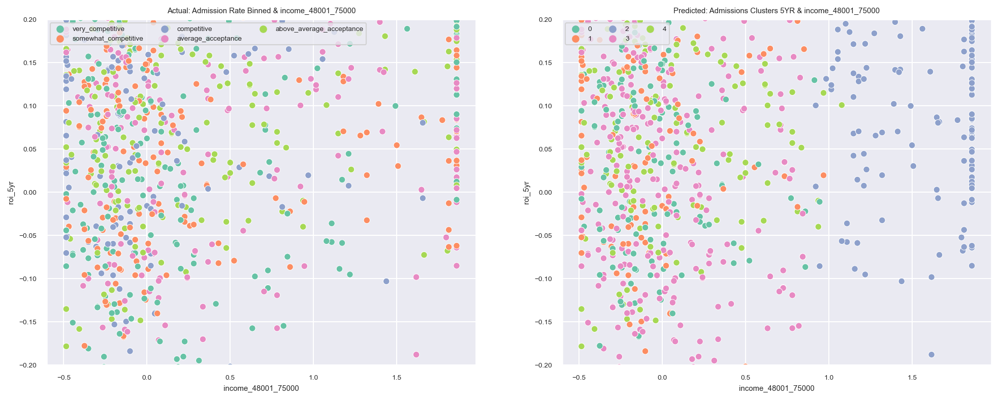

In [24]:
# seeing how month clusters compare against actual month and home age

sns.set(font_scale = 0.6)
plt.subplots(1, 2, figsize = (16, 6), sharex = False, sharey = False)

plt.subplot(121)
sns.scatterplot(
        x = "income_48001_75000",
        y = "roi_5yr",
        data = train_imputed.sample(2000, random_state = 123), 
        hue = "admission_rate_binned",
        palette = ['#66c2a5','#fc8d62','#8da0cb','#e78ac3','#a6d854']
)

plt.title("Actual: Admission Rate Binned & income_48001_75000")
plt.legend(loc = 'upper left', ncol = 3)
plt.ylim(-.2, .2)

plt.subplot(122)
sns.scatterplot(
        x = "income_48001_75000",
        y = "roi_5yr",
        data = train_scaled.sample(2000, random_state = 123), 
        hue = "admission_clusters_5yr",
        palette = ['#66c2a5','#fc8d62','#8da0cb','#e78ac3','#a6d854']
)

plt.title("Predicted: Admissions Clusters 5YR & income_48001_75000")
plt.legend(loc = 'upper left', ncol = 3)
plt.ylim(-.2, .2)
plt.show()

----
### ``Cluster Number 2: Institution Control``


In [25]:
# setting features to cluster on 

X_control = train_scaled[[
    'admission_rate',
    'institution_control_Foreign',
    'institution_control_Private, for-profit',
    'institution_control_Private, nonprofit',
    'institution_control_Public'
    ]]

# validate df
X_val = validate_scaled[[
    'admission_rate',
    'institution_control_Foreign',
    'institution_control_Private, for-profit',
    'institution_control_Private, nonprofit',
    'institution_control_Public'
    ]]

# test df
X_test = test_scaled[[
    'admission_rate',
    'institution_control_Foreign',
    'institution_control_Private, for-profit',
    'institution_control_Private, nonprofit',
    'institution_control_Public'
    ]]

X_control.head()

,admission_rate,institution_control_Foreign,"institution_control_Private, for-profit","institution_control_Private, nonprofit",institution_control_Public
25530,0.754616,False,False,False,True
53875,-1.195821,False,False,True,False
42932,0.437804,False,False,False,True
45495,0.108844,False,False,True,False
25003,-0.412536,False,False,True,False


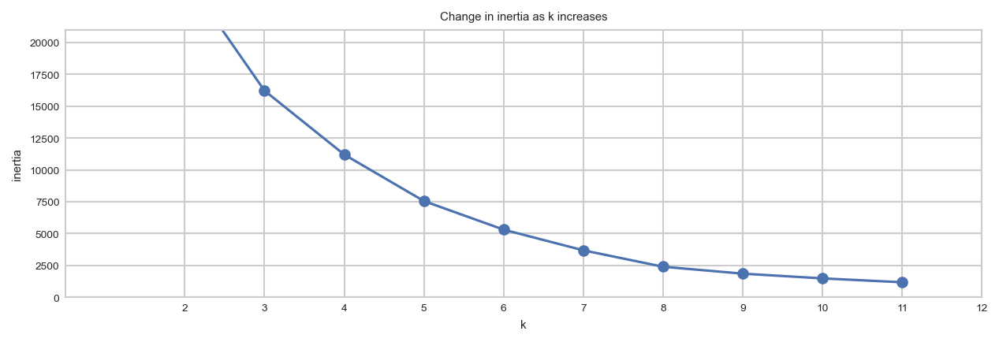

In [26]:
# KMeans Elbow-method

with plt.style.context('seaborn-whitegrid'):

    plt.figure(figsize=(10, 3))
    pd.Series({k: KMeans(k).fit(X_control).inertia_ for k in range(1, 12)}).plot(marker = 'o')
    plt.xticks(range(2, 13))
    
    plt.ylim(0, 21000)
    plt.xlabel('k')
    plt.ylabel('inertia')
    plt.title('Change in inertia as k increases')

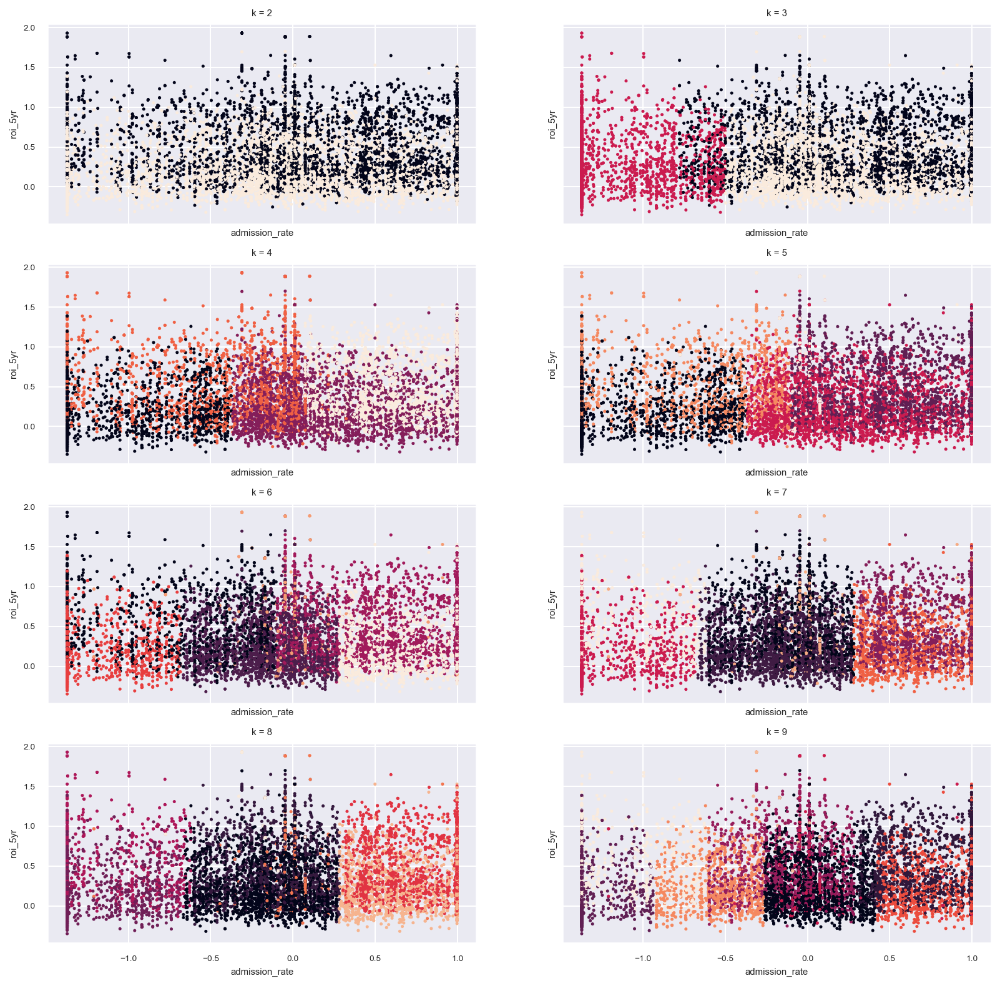

In [27]:
# plotting inertia for number of KMeans clusters

fig, axs = plt.subplots(4, 2, figsize=(13, 13), sharex=True, sharey=True)

for ax, k in zip(axs.ravel(), range(2, 13)):
    
    X2 = X_control.sample(10000, random_state = 123)

    # creating and fitting KMeans
    clusters = KMeans(k).fit(X2).predict(X2)

    X2["roi_5yr"] = train_scaled["roi_5yr"]

    ax.scatter(
        X2["admission_rate"],
        X2["roi_5yr"],
        c = clusters,
        s = 2)

    ax.set(title='k = {}'.format(k), xlabel = 'admission_rate', ylabel = 'roi_5yr')

In [28]:
ref_coeff = 0

for n_cluster in range(2, 11):

    kmeans = KMeans(n_clusters = n_cluster).fit(X2)

    label = kmeans.labels_

    sil_coeff = silhouette_score(X2, label, metric='euclidean')
    rel_coeff = (sil_coeff - ref_coeff)/ref_coeff
    ref_coeff = sil_coeff
    
    print("For n_clusters = {}, The Relative Silhouette Coefficient is {:.4f} and relative difference of {:.3f}".format(n_cluster, sil_coeff, rel_coeff))

For n_clusters = 2, The Relative Silhouette Coefficient is 0.4049 and relative difference of inf
For n_clusters = 3, The Relative Silhouette Coefficient is 0.4032 and relative difference of -0.004
For n_clusters = 4, The Relative Silhouette Coefficient is 0.4033 and relative difference of 0.000
For n_clusters = 5, The Relative Silhouette Coefficient is 0.4539 and relative difference of 0.125
For n_clusters = 6, The Relative Silhouette Coefficient is 0.4339 and relative difference of -0.044
For n_clusters = 7, The Relative Silhouette Coefficient is 0.4203 and relative difference of -0.031
For n_clusters = 8, The Relative Silhouette Coefficient is 0.4385 and relative difference of 0.043
For n_clusters = 9, The Relative Silhouette Coefficient is 0.4373 and relative difference of -0.003
For n_clusters = 10, The Relative Silhouette Coefficient is 0.4397 and relative difference of 0.006


In [29]:
# fitting of KMeans n_cluster to 3

kmeans = KMeans(n_clusters = 3)
kmeans.fit(X_control)

train_clusters = kmeans.predict(X_control)

In [30]:
# creating cluster for ea. dataset 

train_control_clusters = kmeans.predict(X_control)
val_control_clusters = kmeans.predict(X_val)
test_control_clusters = kmeans.predict(X_test)

# viewing cluster samples
pd.DataFrame(train_control_clusters).rename(columns = {0: "Cluster Sample"}).sample(10, random_state = 123)

,Cluster Sample
21417,0
28667,0
7477,0
24935,1
24966,0
7142,0
30603,2
7930,1
31203,0
1107,1


In [31]:
# adding clusters back to original datasets

train_scaled["control_clusters_5yr"] = train_control_clusters
validate_scaled["control_clusters_5yr"] = val_control_clusters
test_scaled["control_clusters_5yr"] = test_control_clusters

train_scaled.head()

,unit_id_institution,college_name,state_post_code,zip_code,city,region_ipeds,title_IV_eligibility,pred_degree,pred_degree_0and4,degree_name,degree_code,major_code,major_name,branch_number,avg_net_price_public,avg_net_price_private,full_time_net_tuition_revenue,off_campus_cost_of_attendace,on_campus_cost_of_attendace,admission_rate,graduate_number,ACT_score_mid,avg_sat_admitted,required_score,avg_faculty_salary,online_only,comp_rt_ft_150over_expected_time,comp_rt_ft_150over_expected_time_two_races,comp_rt_ft_150over_expected_time_native_american,comp_rt_ft_150over_expected_time_asian,comp_rt_ft_150over_expected_time_black,comp_rt_ft_150over_expected_time_hispanic,comp_rt_ft_150over_expected_time_non_resident,comp_rt_ft_150over_expected_time_unknown_race,comp_rt_ft_150over_expected_time_white,share_entering_students_first_ft,share_of_part_time,first_time_ft_student_retention,first_time_pt_student_retention,enrollment_share_two_races,enrollment_share_native_american,enrollment_share_asian,enrollment_share_black,enrollment_share_hispanic,enrollment_share_pac_islander,enrollment_share_non_resident,enrollment_share_unknown,enrollment_share_white,undergraduate_number_pell_grant_fedral_loan,med_debt_pell_students,median_debt_completed,median_debt_non_first_generation,median_debt_non_pell,fedral_loan_full_time_first_time_undergraduate,pell_grant_full_time_first_time_undergraduate,deg_percent_awarded_agriculture_operations,deg_percent_awarded_natural_resources,deg_percent_awarded_architecture,deg_percent_awarded_area_ethnic_cultural_gender,deg_percent_awarded_communication_journalism,deg_percent_awarded_communication_tech,deg_percent_awarded_computer_science,deg_percent_awarded_personal_culinary_services,deg_percent_awarded_education,deg_percent_awarded_engineering,deg_percent_awarded_engineering_tech,deg_percent_awarded_foreign_language_literatures,deg_percent_awarded_human_science,deg_percent_awarded_legal_profession,deg_percent_awarded_english_lang,deg_percent_awarded_general_studies,deg_percent_awarded_library_sciences,deg_percent_awarded_bio_sciences,deg_percent_awarded_mathematics,deg_percent_awarded_military_tech,deg_percent_awarded_intedisciplinary_studies,deg_percent_awarded_leisure_fitness,deg_percent_awarded_philosophy,deg_percent_awarded_theology,deg_percent_awarded_physical_sciences,deg_percent_awarded_science_tech,deg_percent_awarded_psychology,deg_percent_awarded_homeland_security,deg_percent_awarded_public_admin,deg_percent_awarded_social_sciences,deg_percent_awarded_construction_trades,deg_percent_awarded_mechanic_repair,deg_percent_awarded_precision_production,deg_percent_awarded_transportation_materials,deg_percent_awarded_visual_and_performing_arts,deg_percent_awarded_health,deg_percent_awarded_business_management,deg_percent_awarded_history,non_deg_seeking,avg_net_price,2017,2018,2019,Grand Total,roi_5yr,pct_roi_5yr,roi_10yr,pct_roi_10yr,roi_20yr,pct_roi_20yr,income_0_30000,income_30001_48000,income_48001_75000,income_75001_110000,income_over_110000,major_category_Agriculture,major_category_Architecture,"major_category_Area, Ethnic, and Civilization Studies",major_category_Biology and Life Sciences,major_category_Business,major_category_Communication Technologies,major_category_Communications,major_category_Computer and Information Sciences,major_category_Construction Services,major_category_Cosmetology Services and Culinary Arts,major_category_Criminal Justice and Fire Protection,major_category_Education Administration and Teaching,major_category_Electrical and Mechanic Repairs and Technologies,major_category_Engineering,major_category_Engineering Technologies,"major_category_English Language, Literature, and Composition",major_category_Environment and Natural Resources,major_category_Family and Consumer Sciences,major_category_Fine Arts,major_category_History,major_category_Interdisciplinary and Multi-Disciplinary Studies (General),major_category_Law,major_category_Liberal Arts and Humanities,major_category_Librar

In [32]:
# printing average admissions rate by control cluster

unique_clusters = sorted(train_scaled["control_clusters_5yr"].unique().tolist())

container = []

for cluster in unique_clusters:
    
    metric = {
    'control cluster': cluster,
    'admission rate': round(train_scaled[train_scaled["control_clusters_5yr"] == cluster]["admission_rate"].mean(), 3),
    'min 5YR ROI': round(train_scaled[train_scaled["control_clusters_5yr"] == cluster]["roi_5yr"].min(), 3),
    'max 5YR ROI': round(train_scaled[train_scaled["control_clusters_5yr"] == cluster]["roi_5yr"].max(), 3),
    'range of 5YR ROI': round((train_scaled[train_scaled["control_clusters_5yr"] == cluster]["roi_5yr"].max() - train_scaled[train_scaled["control_clusters_5yr"] == cluster]["roi_5yr"].min()), 2),
    'average 5YR ROI': round(train_scaled[train_scaled["control_clusters_5yr"] == cluster]["roi_5yr"].mean(), 3)
    }

    container.append(metric)

cluster_description = pd.DataFrame(container).sort_values(by = "average 5YR ROI", ascending = False).reset_index(drop = True)
cluster_description

,control cluster,admission rate,min 5YR ROI,max 5YR ROI,range of 5YR ROI,average 5YR ROI
0,1,0.220,-0.289,2.103,2.39,0.545
1,2,-1.115,-0.385,1.930,2.32,0.307
2,0,0.265,-0.322,1.930,2.25,0.273


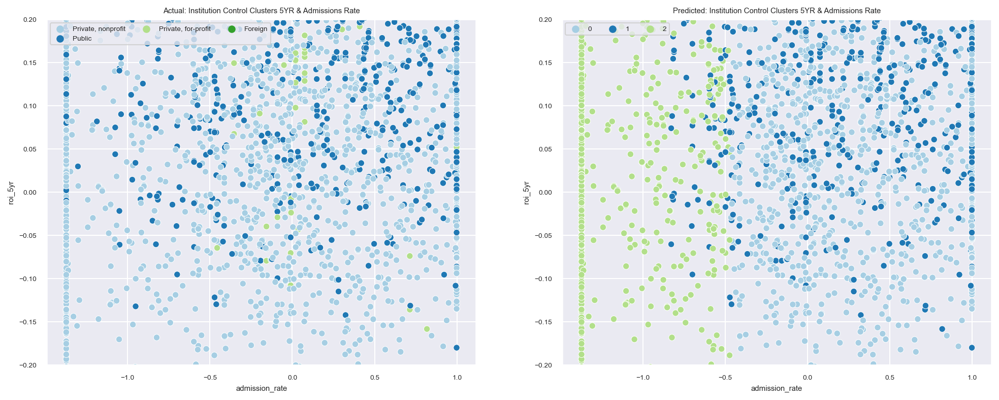

In [33]:
# seeing how month clusters compare against actual month and home age

sns.set(font_scale = 0.6)
plt.subplots(1, 2, figsize = (16, 6), sharex = False, sharey = False)

plt.subplot(121)
sns.scatterplot(
        x = "admission_rate",
        y = "roi_5yr",
        data = train_imputed.sample(5000, random_state = 123), 
        hue = "institution_control",
        palette = ['#a6cee3','#1f78b4','#b2df8a','#33a02c']
)

plt.title("Actual: Institution Control Clusters 5YR & Admissions Rate")
plt.legend(loc = 'upper left', ncol = 3)
plt.ylim(-.2, .2)

plt.subplot(122)
sns.scatterplot(
        x = "admission_rate",
        y = "roi_5yr",
        data = train_scaled.sample(5000, random_state = 123), 
        hue = "control_clusters_5yr",
        palette = ['#a6cee3','#1f78b4','#b2df8a']
)

plt.title("Predicted: Institution Control Clusters 5YR & Admissions Rate")
plt.legend(loc = 'upper left', ncol = 3)
plt.ylim(-.2, .2)
plt.show()

----
### **``Cluster Number 3: University Region Cluster``**

In [34]:
# setting features to cluster on 

X_region = train_scaled[[
    'full_time_net_tuition_revenue',
    'us_region_east_north_atlantic',	
    'us_region_east_north_central',	
    'us_region_east_south_atlantic',	
    'us_region_east_south_central',	
    'us_region_midwest_north_central',	
    'us_region_midwest_south_central',	
    'us_region_us_foreign',
    'us_region_west_mountain',
    'us_region_west_pacific'
    ]]

# validate df
X_val = validate_scaled[[
    'full_time_net_tuition_revenue',
    'us_region_east_north_atlantic',	
    'us_region_east_north_central',	
    'us_region_east_south_atlantic',	
    'us_region_east_south_central',	
    'us_region_midwest_north_central',	
    'us_region_midwest_south_central',	
    'us_region_us_foreign',
    'us_region_west_mountain',
    'us_region_west_pacific'
    ]]

# test df
X_test = test_scaled[[
    'full_time_net_tuition_revenue',
    'us_region_east_north_atlantic',	
    'us_region_east_north_central',	
    'us_region_east_south_atlantic',	
    'us_region_east_south_central',	
    'us_region_midwest_north_central',	
    'us_region_midwest_south_central',	
    'us_region_us_foreign',
    'us_region_west_mountain',
    'us_region_west_pacific'
    ]]

X_region.head()

,full_time_net_tuition_revenue,us_region_east_north_atlantic,us_region_east_north_central,us_region_east_south_atlantic,us_region_east_south_central,us_region_midwest_north_central,us_region_midwest_south_central,us_region_us_foreign,us_region_west_mountain,us_region_west_pacific
25530,-0.446191,False,False,False,True,False,False,False,False,False
53875,0.046191,False,False,True,False,False,False,False,False,False
42932,-0.416483,False,False,False,False,False,True,False,False,False
45495,-0.205367,False,True,False,False,False,False,False,False,False
25003,0.502156,True,False,False,False,False,False,False,False,False


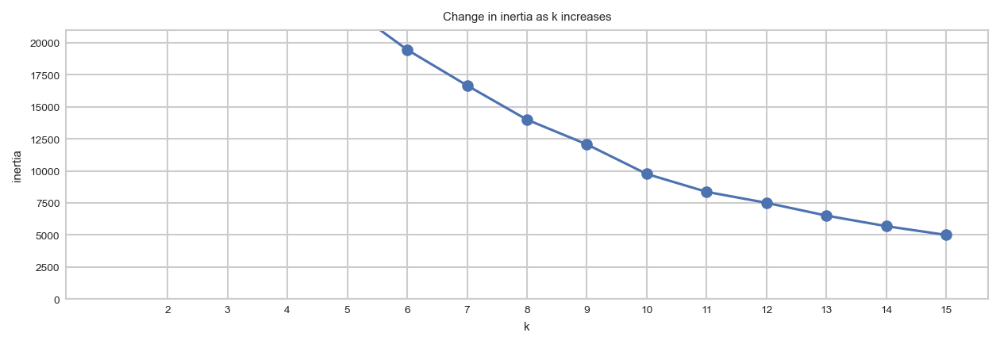

In [35]:
# KMeans Elbow-method

with plt.style.context('seaborn-whitegrid'):

    plt.figure(figsize = (10, 3))
    pd.Series({k: KMeans(k).fit(X_region).inertia_ for k in range(1, 16)}).plot(marker = 'o')
    plt.xticks(range(2, 16))
    
    plt.ylim(0, 21000)
    plt.xlabel('k')
    plt.ylabel('inertia')
    plt.title('Change in inertia as k increases')

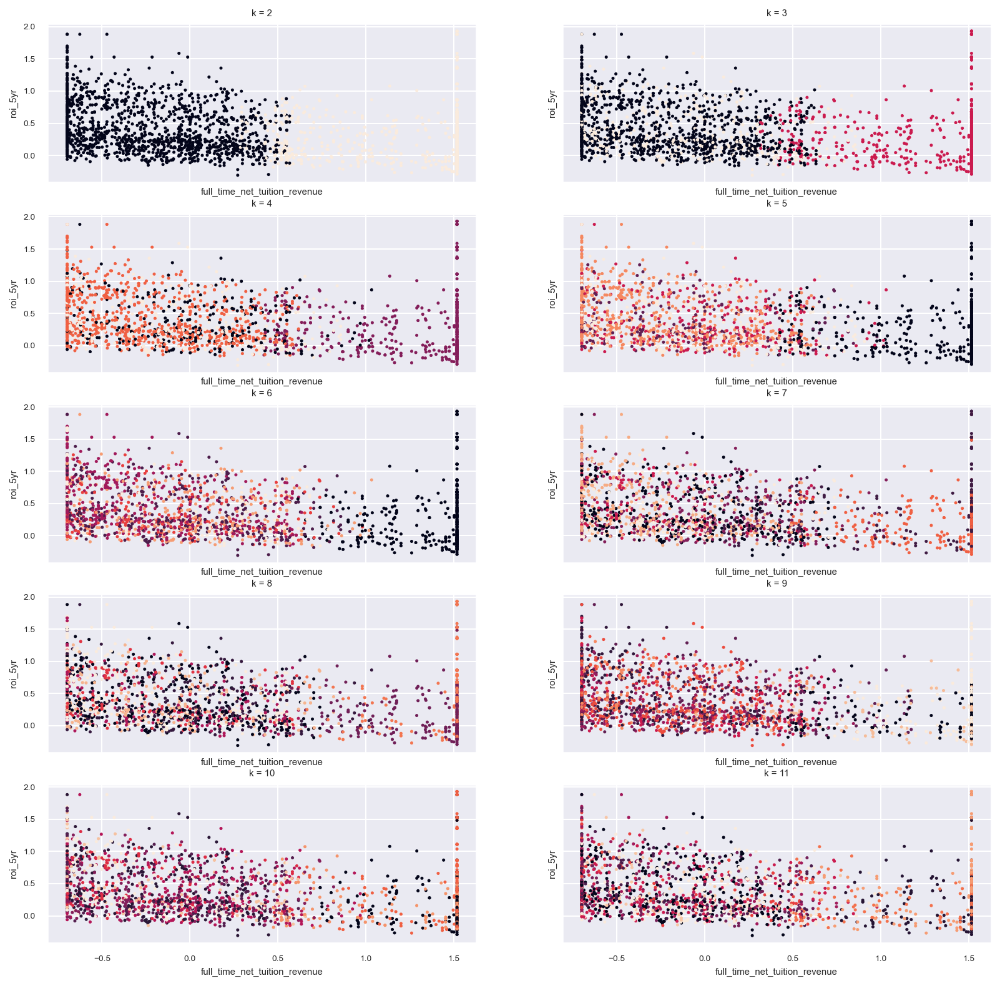

In [36]:
# plotting inertia for number of KMeans clusters

fig, axs = plt.subplots(5, 2, figsize=(13, 13), sharex=True, sharey=True)

for ax, k in zip(axs.ravel(), range(2, 16)):
    
    X3 = X_region.sample(2000, random_state = 123)

    # creating and fitting KMeans
    clusters = KMeans(k).fit(X3).predict(X3)

    X3["roi_5yr"] = train_scaled["roi_5yr"]

    ax.scatter(
        X3["full_time_net_tuition_revenue"],
        X3["roi_5yr"],
        c = clusters,
        s = 2)

    ax.set(title='k = {}'.format(k), xlabel = 'full_time_net_tuition_revenue', ylabel = 'roi_5yr')

In [37]:
ref_coeff = 0

for n_cluster in range(2, 13):

    kmeans = KMeans(n_clusters = n_cluster).fit(X3)

    label = kmeans.labels_

    sil_coeff = silhouette_score(X3, label, metric = 'euclidean')
    rel_coeff = (sil_coeff - ref_coeff)/ref_coeff
    ref_coeff = sil_coeff
    print("For n_clusters = {}, The Relative Silhouette Coefficient is {:.4f} and relative difference of {:.3f}".format(n_cluster, sil_coeff, rel_coeff))

# obtaining the best coefficient results at n_clusters = 5: using sklearn silhouette coefficient method

For n_clusters = 2, The Relative Silhouette Coefficient is 0.2632 and relative difference of inf
For n_clusters = 3, The Relative Silhouette Coefficient is 0.2248 and relative difference of -0.146
For n_clusters = 4, The Relative Silhouette Coefficient is 0.2946 and relative difference of 0.310
For n_clusters = 5, The Relative Silhouette Coefficient is 0.3124 and relative difference of 0.060
For n_clusters = 6, The Relative Silhouette Coefficient is 0.3587 and relative difference of 0.148
For n_clusters = 7, The Relative Silhouette Coefficient is 0.3957 and relative difference of 0.103
For n_clusters = 8, The Relative Silhouette Coefficient is 0.4309 and relative difference of 0.089
For n_clusters = 9, The Relative Silhouette Coefficient is 0.4535 and relative difference of 0.052
For n_clusters = 10, The Relative Silhouette Coefficient is 0.4880 and relative difference of 0.076
For n_clusters = 11, The Relative Silhouette Coefficient is 0.5003 and relative difference of 0.025
For n_clu

In [38]:
# fitting of KMeans cluster to n_cluster 9

kmeans = KMeans(n_clusters = 9)
kmeans.fit(X_region)

train_clusters = kmeans.predict(X_region)

In [39]:
# creating cluster for ea. dataset 

train_region_clusters_5yr = kmeans.predict(X_region)
val_region_clusters_5yr = kmeans.predict(X_val)
test_region_clusters_5yr = kmeans.predict(X_test)

# viewing cluster samples
pd.DataFrame(train_region_clusters_5yr).rename(columns = {0: "Cluster Sample"}).sample(10, random_state = 123)

,Cluster Sample
21417,8
28667,5
7477,3
24935,3
24966,4
7142,2
30603,2
7930,2
31203,3
1107,3


In [40]:
# adding clusters back to original datasets

train_scaled["region_clusters_5yr"] = train_region_clusters_5yr
validate_scaled["region_clusters_5yr"] = val_region_clusters_5yr
test_scaled["region_clusters_5yr"] = test_region_clusters_5yr

train_scaled.head()

,unit_id_institution,college_name,state_post_code,zip_code,city,region_ipeds,title_IV_eligibility,pred_degree,pred_degree_0and4,degree_name,degree_code,major_code,major_name,branch_number,avg_net_price_public,avg_net_price_private,full_time_net_tuition_revenue,off_campus_cost_of_attendace,on_campus_cost_of_attendace,admission_rate,graduate_number,ACT_score_mid,avg_sat_admitted,required_score,avg_faculty_salary,online_only,comp_rt_ft_150over_expected_time,comp_rt_ft_150over_expected_time_two_races,comp_rt_ft_150over_expected_time_native_american,comp_rt_ft_150over_expected_time_asian,comp_rt_ft_150over_expected_time_black,comp_rt_ft_150over_expected_time_hispanic,comp_rt_ft_150over_expected_time_non_resident,comp_rt_ft_150over_expected_time_unknown_race,comp_rt_ft_150over_expected_time_white,share_entering_students_first_ft,share_of_part_time,first_time_ft_student_retention,first_time_pt_student_retention,enrollment_share_two_races,enrollment_share_native_american,enrollment_share_asian,enrollment_share_black,enrollment_share_hispanic,enrollment_share_pac_islander,enrollment_share_non_resident,enrollment_share_unknown,enrollment_share_white,undergraduate_number_pell_grant_fedral_loan,med_debt_pell_students,median_debt_completed,median_debt_non_first_generation,median_debt_non_pell,fedral_loan_full_time_first_time_undergraduate,pell_grant_full_time_first_time_undergraduate,deg_percent_awarded_agriculture_operations,deg_percent_awarded_natural_resources,deg_percent_awarded_architecture,deg_percent_awarded_area_ethnic_cultural_gender,deg_percent_awarded_communication_journalism,deg_percent_awarded_communication_tech,deg_percent_awarded_computer_science,deg_percent_awarded_personal_culinary_services,deg_percent_awarded_education,deg_percent_awarded_engineering,deg_percent_awarded_engineering_tech,deg_percent_awarded_foreign_language_literatures,deg_percent_awarded_human_science,deg_percent_awarded_legal_profession,deg_percent_awarded_english_lang,deg_percent_awarded_general_studies,deg_percent_awarded_library_sciences,deg_percent_awarded_bio_sciences,deg_percent_awarded_mathematics,deg_percent_awarded_military_tech,deg_percent_awarded_intedisciplinary_studies,deg_percent_awarded_leisure_fitness,deg_percent_awarded_philosophy,deg_percent_awarded_theology,deg_percent_awarded_physical_sciences,deg_percent_awarded_science_tech,deg_percent_awarded_psychology,deg_percent_awarded_homeland_security,deg_percent_awarded_public_admin,deg_percent_awarded_social_sciences,deg_percent_awarded_construction_trades,deg_percent_awarded_mechanic_repair,deg_percent_awarded_precision_production,deg_percent_awarded_transportation_materials,deg_percent_awarded_visual_and_performing_arts,deg_percent_awarded_health,deg_percent_awarded_business_management,deg_percent_awarded_history,non_deg_seeking,avg_net_price,2017,2018,2019,Grand Total,roi_5yr,pct_roi_5yr,roi_10yr,pct_roi_10yr,roi_20yr,pct_roi_20yr,income_0_30000,income_30001_48000,income_48001_75000,income_75001_110000,income_over_110000,major_category_Agriculture,major_category_Architecture,"major_category_Area, Ethnic, and Civilization Studies",major_category_Biology and Life Sciences,major_category_Business,major_category_Communication Technologies,major_category_Communications,major_category_Computer and Information Sciences,major_category_Construction Services,major_category_Cosmetology Services and Culinary Arts,major_category_Criminal Justice and Fire Protection,major_category_Education Administration and Teaching,major_category_Electrical and Mechanic Repairs and Technologies,major_category_Engineering,major_category_Engineering Technologies,"major_category_English Language, Literature, and Composition",major_category_Environment and Natural Resources,major_category_Family and Consumer Sciences,major_category_Fine Arts,major_category_History,major_category_Interdisciplinary and Multi-Disciplinary Studies (General),major_category_Law,major_category_Liberal Arts and Humanities,major_category_Librar

In [41]:
# printing average admissions rate by control cluster

unique_clusters = sorted(train_scaled["region_clusters_5yr"].unique().tolist())

container = []

for cluster in unique_clusters:
    
    metric = {
    'region cluster': cluster,
    'full-time tuition revenue': round(train_scaled[train_scaled["region_clusters_5yr"] == cluster]["full_time_net_tuition_revenue"].mean(), 3),
    'min 5YR ROI': round(train_scaled[train_scaled["region_clusters_5yr"] == cluster]["roi_5yr"].min(), 3),
    'max 5YR ROI': round(train_scaled[train_scaled["region_clusters_5yr"] == cluster]["roi_5yr"].max(), 3),
    'range of 5YR ROI': round((train_scaled[train_scaled["region_clusters_5yr"] == cluster]["roi_5yr"].max() - train_scaled[train_scaled["region_clusters_5yr"] == cluster]["roi_5yr"].min()), 2),
    'average 5YR ROI': round(train_scaled[train_scaled["region_clusters_5yr"] == cluster]["roi_5yr"].mean(), 3)
    }

    container.append(metric)

cluster_description = pd.DataFrame(container).sort_values(by = "average 5YR ROI", ascending = False).reset_index(drop = True)
cluster_description

,region cluster,full-time tuition revenue,min 5YR ROI,max 5YR ROI,range of 5YR ROI,average 5YR ROI
0,8,-0.258,-0.169,1.930,2.10,0.501
1,1,-0.249,-0.200,2.103,2.30,0.457
2,7,-0.022,-0.279,1.930,2.21,0.417
3,5,-0.187,-0.215,1.969,2.18,0.405
4,0,1.392,-0.385,2.103,2.49,0.394
5,6,-0.182,-0.284,1.883,2.17,0.379
6,4,0.025,-0.280,1.883,2.16,0.374
7,3,-0.055,-0.382,2.103,2.49,0.368
8,2,-0.087,-0.322,1.930,2.25,0.367


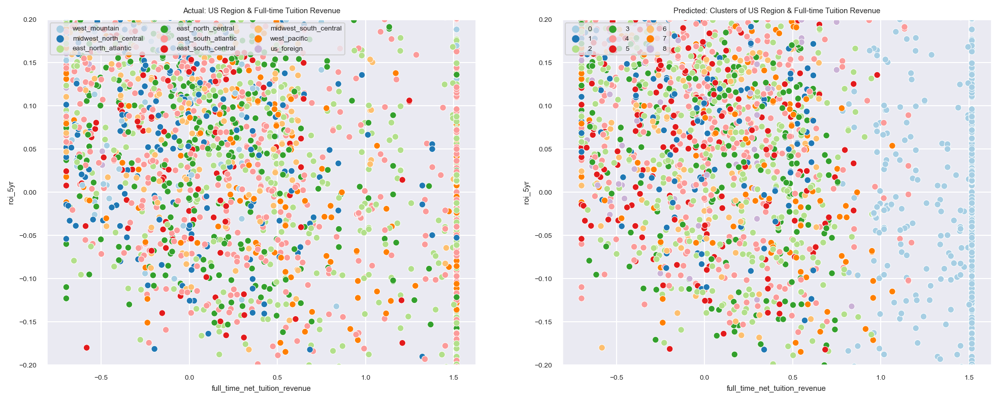

In [42]:
# seeing how month clusters compare against actual month and home age

sns.set(font_scale = 0.6)
plt.subplots(1, 2, figsize = (16, 6), sharex = False, sharey = False)

plt.subplot(121)
sns.scatterplot(
        x = "full_time_net_tuition_revenue",
        y = "roi_5yr",
        data = train_imputed.sample(5000, random_state = 123), 
        hue = "us_region",
        palette = ['#a6cee3','#1f78b4','#b2df8a','#33a02c','#fb9a99','#e31a1c','#fdbf6f','#ff7f00','#cab2d6']
)

plt.title("Actual: US Region & Full-time Tuition Revenue")
plt.legend(loc = 'upper left', ncol = 3)
plt.ylim(-.2, .2)

plt.subplot(122)
sns.scatterplot(
        x = "full_time_net_tuition_revenue",
        y = "roi_5yr",
        data = train_scaled.sample(5000, random_state = 123), 
        hue = "region_clusters_5yr",
        palette = ['#a6cee3','#1f78b4','#b2df8a','#33a02c','#fb9a99','#e31a1c','#fdbf6f','#ff7f00','#cab2d6']
)

plt.title("Predicted: Clusters of US Region & Full-time Tuition Revenue")
plt.legend(loc = 'upper left', ncol = 3)
plt.ylim(-.2, .2)
plt.show()

----
### ``Cluster Number 4: Share of First-time, Full-time Students``

In [43]:
# setting features to cluster on 

X_full_time = train_scaled[[
    'avg_faculty_salary',
    'share_entering_ft_binned_below_average',
    'share_entering_ft_binned_average',
    'share_entering_ft_binned_above_average',
    'share_entering_ft_binned_highest_average',
    ]]

# validate df
X_val = validate_scaled[[
    'avg_faculty_salary',
    'share_entering_ft_binned_below_average',
    'share_entering_ft_binned_average',
    'share_entering_ft_binned_above_average',
    'share_entering_ft_binned_highest_average'
    ]]

# test df
X_test = test_scaled[[
    'avg_faculty_salary',
    'share_entering_ft_binned_below_average',
    'share_entering_ft_binned_average',
    'share_entering_ft_binned_above_average',
    'share_entering_ft_binned_highest_average'
    ]]

X_full_time.head()

,avg_faculty_salary,share_entering_ft_binned_below_average,share_entering_ft_binned_average,share_entering_ft_binned_above_average,share_entering_ft_binned_highest_average
25530,0.212325,False,True,False,False
53875,-0.719918,True,False,False,False
42932,-0.060456,True,False,False,False
45495,-0.523949,True,False,False,False
25003,1.159755,False,False,False,True


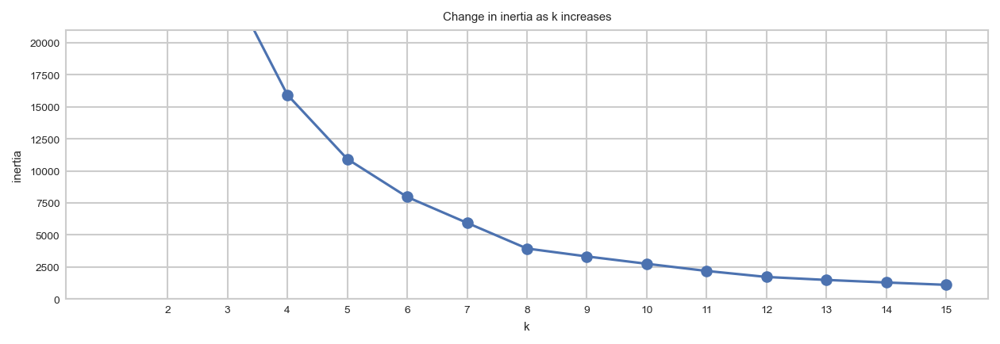

In [44]:
# KMeans Elbow-method

with plt.style.context('seaborn-whitegrid'):

    plt.figure(figsize = (10, 3))
    pd.Series({k: KMeans(k).fit(X_full_time).inertia_ for k in range(1, 16)}).plot(marker = 'o')
    plt.xticks(range(2, 16))
    
    plt.ylim(0, 21000)
    plt.xlabel('k')
    plt.ylabel('inertia')
    plt.title('Change in inertia as k increases')

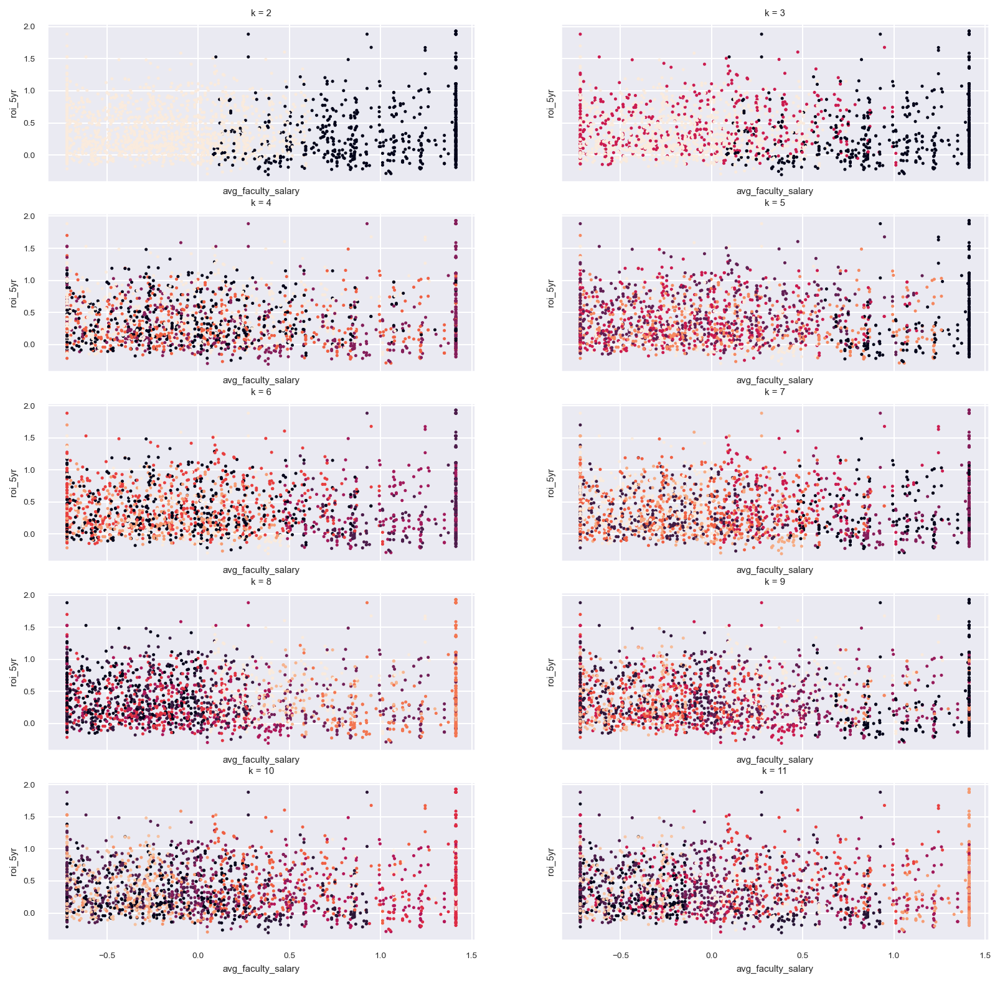

In [45]:
# plotting inertia for number of KMeans clusters

fig, axs = plt.subplots(5, 2, figsize=(13, 13), sharex=True, sharey=True)

for ax, k in zip(axs.ravel(), range(2, 16)):
    
    X4 = X_full_time.sample(2000, random_state = 123)

    # creating and fitting KMeans
    clusters = KMeans(k).fit(X4).predict(X4)

    X4["roi_5yr"] = train_scaled["roi_5yr"]

    ax.scatter(
        X4["avg_faculty_salary"],
        X4["roi_5yr"],
        c = clusters,
        s = 2)

    ax.set(title='k = {}'.format(k), xlabel = 'avg_faculty_salary', ylabel = 'roi_5yr')

In [46]:
ref_coeff = 0

for n_cluster in range(2, 13):

    kmeans = KMeans(n_clusters = n_cluster).fit(X4)

    label = kmeans.labels_

    sil_coeff = silhouette_score(X4, label, metric = 'euclidean')
    rel_coeff = (sil_coeff - ref_coeff)/ref_coeff
    ref_coeff = sil_coeff
    print("For n_clusters = {}, The Relative Silhouette Coefficient is {:.4f} and relative difference of {:.3f}".format(n_cluster, sil_coeff, rel_coeff))

# obtaining the best coefficient results at n_clusters = 5: using sklearn silhouette coefficient method

For n_clusters = 2, The Relative Silhouette Coefficient is 0.2781 and relative difference of inf
For n_clusters = 3, The Relative Silhouette Coefficient is 0.3162 and relative difference of 0.137
For n_clusters = 4, The Relative Silhouette Coefficient is 0.4707 and relative difference of 0.489
For n_clusters = 5, The Relative Silhouette Coefficient is 0.4782 and relative difference of 0.016
For n_clusters = 6, The Relative Silhouette Coefficient is 0.4906 and relative difference of 0.026
For n_clusters = 7, The Relative Silhouette Coefficient is 0.4731 and relative difference of -0.036
For n_clusters = 8, The Relative Silhouette Coefficient is 0.4663 and relative difference of -0.014
For n_clusters = 9, The Relative Silhouette Coefficient is 0.4642 and relative difference of -0.005
For n_clusters = 10, The Relative Silhouette Coefficient is 0.4494 and relative difference of -0.032
For n_clusters = 11, The Relative Silhouette Coefficient is 0.4421 and relative difference of -0.016
For n

In [47]:
# initial fitting of KMeans cluster

kmeans = KMeans(n_clusters = 6)
kmeans.fit(X_full_time)

train_clusters = kmeans.predict(X_full_time)

In [48]:
# creating cluster for ea. dataset 

train_ft_clusters_5yr = kmeans.predict(X_full_time)
val_ft_clusters_5yr = kmeans.predict(X_val)
test_ft_clusters_5yr = kmeans.predict(X_test)

# viewing cluster samples
pd.DataFrame(train_ft_clusters_5yr).rename(columns = {0: "Cluster Sample"}).sample(10, random_state = 123)

,Cluster Sample
21417,0
28667,1
7477,4
24935,3
24966,0
7142,4
30603,5
7930,3
31203,4
1107,3


In [49]:
# adding clusters back to original datasets

train_scaled["ft_clusters_5yr"] = train_ft_clusters_5yr
validate_scaled["ft_clusters_5yr"] = val_ft_clusters_5yr
test_scaled["ft_clusters_5yr"] = test_ft_clusters_5yr

train_scaled.head()

,unit_id_institution,college_name,state_post_code,zip_code,city,region_ipeds,title_IV_eligibility,pred_degree,pred_degree_0and4,degree_name,degree_code,major_code,major_name,branch_number,avg_net_price_public,avg_net_price_private,full_time_net_tuition_revenue,off_campus_cost_of_attendace,on_campus_cost_of_attendace,admission_rate,graduate_number,ACT_score_mid,avg_sat_admitted,required_score,avg_faculty_salary,online_only,comp_rt_ft_150over_expected_time,comp_rt_ft_150over_expected_time_two_races,comp_rt_ft_150over_expected_time_native_american,comp_rt_ft_150over_expected_time_asian,comp_rt_ft_150over_expected_time_black,comp_rt_ft_150over_expected_time_hispanic,comp_rt_ft_150over_expected_time_non_resident,comp_rt_ft_150over_expected_time_unknown_race,comp_rt_ft_150over_expected_time_white,share_entering_students_first_ft,share_of_part_time,first_time_ft_student_retention,first_time_pt_student_retention,enrollment_share_two_races,enrollment_share_native_american,enrollment_share_asian,enrollment_share_black,enrollment_share_hispanic,enrollment_share_pac_islander,enrollment_share_non_resident,enrollment_share_unknown,enrollment_share_white,undergraduate_number_pell_grant_fedral_loan,med_debt_pell_students,median_debt_completed,median_debt_non_first_generation,median_debt_non_pell,fedral_loan_full_time_first_time_undergraduate,pell_grant_full_time_first_time_undergraduate,deg_percent_awarded_agriculture_operations,deg_percent_awarded_natural_resources,deg_percent_awarded_architecture,deg_percent_awarded_area_ethnic_cultural_gender,deg_percent_awarded_communication_journalism,deg_percent_awarded_communication_tech,deg_percent_awarded_computer_science,deg_percent_awarded_personal_culinary_services,deg_percent_awarded_education,deg_percent_awarded_engineering,deg_percent_awarded_engineering_tech,deg_percent_awarded_foreign_language_literatures,deg_percent_awarded_human_science,deg_percent_awarded_legal_profession,deg_percent_awarded_english_lang,deg_percent_awarded_general_studies,deg_percent_awarded_library_sciences,deg_percent_awarded_bio_sciences,deg_percent_awarded_mathematics,deg_percent_awarded_military_tech,deg_percent_awarded_intedisciplinary_studies,deg_percent_awarded_leisure_fitness,deg_percent_awarded_philosophy,deg_percent_awarded_theology,deg_percent_awarded_physical_sciences,deg_percent_awarded_science_tech,deg_percent_awarded_psychology,deg_percent_awarded_homeland_security,deg_percent_awarded_public_admin,deg_percent_awarded_social_sciences,deg_percent_awarded_construction_trades,deg_percent_awarded_mechanic_repair,deg_percent_awarded_precision_production,deg_percent_awarded_transportation_materials,deg_percent_awarded_visual_and_performing_arts,deg_percent_awarded_health,deg_percent_awarded_business_management,deg_percent_awarded_history,non_deg_seeking,avg_net_price,2017,2018,2019,Grand Total,roi_5yr,pct_roi_5yr,roi_10yr,pct_roi_10yr,roi_20yr,pct_roi_20yr,income_0_30000,income_30001_48000,income_48001_75000,income_75001_110000,income_over_110000,major_category_Agriculture,major_category_Architecture,"major_category_Area, Ethnic, and Civilization Studies",major_category_Biology and Life Sciences,major_category_Business,major_category_Communication Technologies,major_category_Communications,major_category_Computer and Information Sciences,major_category_Construction Services,major_category_Cosmetology Services and Culinary Arts,major_category_Criminal Justice and Fire Protection,major_category_Education Administration and Teaching,major_category_Electrical and Mechanic Repairs and Technologies,major_category_Engineering,major_category_Engineering Technologies,"major_category_English Language, Literature, and Composition",major_category_Environment and Natural Resources,major_category_Family and Consumer Sciences,major_category_Fine Arts,major_category_History,major_category_Interdisciplinary and Multi-Disciplinary Studies (General),major_category_Law,major_category_Liberal Arts and Humanities,major_category_Librar

In [50]:
# printing average admissions rate by control cluster

unique_clusters = sorted(train_scaled["ft_clusters_5yr"].unique().tolist())

container = []

for cluster in unique_clusters:
    
    metric = {
    'full-time cluster': cluster,
    'avg faculty salary': round(train_scaled[train_scaled["ft_clusters_5yr"] == cluster]["avg_faculty_salary"].mean(), 3),
    'min 5YR ROI': round(train_scaled[train_scaled["ft_clusters_5yr"] == cluster]["roi_5yr"].min(), 3),
    'max 5YR ROI': round(train_scaled[train_scaled["ft_clusters_5yr"] == cluster]["roi_5yr"].max(), 3),
    'range of 5YR ROI': round((train_scaled[train_scaled["ft_clusters_5yr"] == cluster]["roi_5yr"].max() - train_scaled[train_scaled["ft_clusters_5yr"] == cluster]["roi_5yr"].min()), 2),
    'average 5YR ROI': round(train_scaled[train_scaled["ft_clusters_5yr"] == cluster]["roi_5yr"].mean(), 3)
    }

    container.append(metric)

cluster_description = pd.DataFrame(container).sort_values(by = "average 5YR ROI", ascending = False).reset_index(drop = True)
cluster_description

,full-time cluster,avg faculty salary,min 5YR ROI,max 5YR ROI,range of 5YR ROI,average 5YR ROI
0,5,1.274,-0.382,2.103,2.49,0.556
1,3,-0.113,-0.322,1.969,2.29,0.457
2,0,-0.090,-0.385,1.696,2.08,0.381
3,4,-0.306,-0.319,1.700,2.02,0.319
4,2,0.877,-0.364,1.528,1.89,0.300
5,1,-0.099,-0.363,2.103,2.47,0.299


----
### ``Cluster Number 5: College Majors``

In [51]:
# setting features to cluster on 

X_majors = train_scaled[[
    'share_of_part_time',
    'major_category_Agriculture',
    'major_category_Architecture',
    'major_category_Area, Ethnic, and Civilization Studies',
    'major_category_Biology and Life Sciences',
    'major_category_Business',
    'major_category_Communication Technologies',
    'major_category_Communications',
    'major_category_Computer and Information Sciences',
    'major_category_Construction Services',
    'major_category_Cosmetology Services and Culinary Arts',
    'major_category_Criminal Justice and Fire Protection',
    'major_category_Education Administration and Teaching',
    'major_category_Electrical and Mechanic Repairs and Technologies',
    'major_category_Engineering',
    'major_category_Engineering Technologies',
    'major_category_English Language, Literature, and Composition',
    'major_category_Environment and Natural Resources',
    'major_category_Family and Consumer Sciences',
    'major_category_Fine Arts',
    'major_category_History',
    'major_category_Interdisciplinary and Multi-Disciplinary Studies (General)',
    'major_category_Law',
    'major_category_Liberal Arts and Humanities',
    'major_category_Library Science',
    'major_category_Linguistics and Foreign Languages',
    'major_category_Mathematics and Statistics',
    'major_category_Medical and Health Sciences and Services',
    'major_category_Military Technologies',
    'major_category_Nuclear, Industrial Radiology, and Biological Technologies',
    'major_category_Philosophy and Religious Studies',
    'major_category_Physical Fitness, Parks, Recreation, and Leisure',
    'major_category_Physical Sciences',
    'major_category_Psychology',
    'major_category_Public Affairs, Policy, and Social Work',
    'major_category_Social Sciences',
    'major_category_Theology and Religious Vocations',
    'major_category_Transportation Sciences and Technologies'
    ]]

# validate df
X_val = validate_scaled[[
    'share_of_part_time',
    'major_category_Agriculture',
    'major_category_Architecture',
    'major_category_Area, Ethnic, and Civilization Studies',
    'major_category_Biology and Life Sciences',
    'major_category_Business',
    'major_category_Communication Technologies',
    'major_category_Communications',
    'major_category_Computer and Information Sciences',
    'major_category_Construction Services',
    'major_category_Cosmetology Services and Culinary Arts',
    'major_category_Criminal Justice and Fire Protection',
    'major_category_Education Administration and Teaching',
    'major_category_Electrical and Mechanic Repairs and Technologies',
    'major_category_Engineering',
    'major_category_Engineering Technologies',
    'major_category_English Language, Literature, and Composition',
    'major_category_Environment and Natural Resources',
    'major_category_Family and Consumer Sciences',
    'major_category_Fine Arts',
    'major_category_History',
    'major_category_Interdisciplinary and Multi-Disciplinary Studies (General)',
    'major_category_Law',
    'major_category_Liberal Arts and Humanities',
    'major_category_Library Science',
    'major_category_Linguistics and Foreign Languages',
    'major_category_Mathematics and Statistics',
    'major_category_Medical and Health Sciences and Services',
    'major_category_Military Technologies',
    'major_category_Nuclear, Industrial Radiology, and Biological Technologies',
    'major_category_Philosophy and Religious Studies',
    'major_category_Physical Fitness, Parks, Recreation, and Leisure',
    'major_category_Physical Sciences',
    'major_category_Psychology',
    'major_category_Public Affairs, Policy, and Social Work',
    'major_category_Social Sciences',
    'major_category_Theology and Religious Vocations',
    'major_category_Transportation Sciences and Technologies'
    ]]

# test df
X_test = test_scaled[[
    'share_of_part_time',
    'major_category_Agriculture',
    'major_category_Architecture',
    'major_category_Area, Ethnic, and Civilization Studies',
    'major_category_Biology and Life Sciences',
    'major_category_Business',
    'major_category_Communication Technologies',
    'major_category_Communications',
    'major_category_Computer and Information Sciences',
    'major_category_Construction Services',
    'major_category_Cosmetology Services and Culinary Arts',
    'major_category_Criminal Justice and Fire Protection',
    'major_category_Education Administration and Teaching',
    'major_category_Electrical and Mechanic Repairs and Technologies',
    'major_category_Engineering',
    'major_category_Engineering Technologies',
    'major_category_English Language, Literature, and Composition',
    'major_category_Environment and Natural Resources',
    'major_category_Family and Consumer Sciences',
    'major_category_Fine Arts',
    'major_category_History',
    'major_category_Interdisciplinary and Multi-Disciplinary Studies (General)',
    'major_category_Law',
    'major_category_Liberal Arts and Humanities',
    'major_category_Library Science',
    'major_category_Linguistics and Foreign Languages',
    'major_category_Mathematics and Statistics',
    'major_category_Medical and Health Sciences and Services',
    'major_category_Military Technologies',
    'major_category_Nuclear, Industrial Radiology, and Biological Technologies',
    'major_category_Philosophy and Religious Studies',
    'major_category_Physical Fitness, Parks, Recreation, and Leisure',
    'major_category_Physical Sciences',
    'major_category_Psychology',
    'major_category_Public Affairs, Policy, and Social Work',
    'major_category_Social Sciences',
    'major_category_Theology and Religious Vocations',
    'major_category_Transportation Sciences and Technologies'
    ]]

X_majors.head()

,share_of_part_time,major_category_Agriculture,major_category_Architecture,"major_category_Area, Ethnic, and Civilization Studies",major_category_Biology and Life Sciences,major_category_Business,major_category_Communication Technologies,major_category_Communications,major_category_Computer and Information Sciences,major_category_Construction Services,major_category_Cosmetology Services and Culinary Arts,major_category_Criminal Justice and Fire Protection,major_category_Education Administration and Teaching,major_category_Electrical and Mechanic Repairs and Technologies,major_category_Engineering,major_category_Engineering Technologies,"major_category_English Language, Literature, and Composition",major_category_Environment and Natural Resources,major_category_Family and Consumer Sciences,major_category_Fine Arts,major_category_History,major_category_Interdisciplinary and Multi-Disciplinary Studies (General),major_category_Law,major_category_Liberal Arts and Humanities,major_category_Library Science,major_category_Linguistics and Foreign Languages,major_category_Mathematics and Statistics,major_category_Medical and Health Sciences and Services,major_category_Military Technologies,"major_category_Nuclear, Industrial Radiology, and Biological Technologies",major_category_Philosophy and Religious Studies,"major_category_Physical Fitness, Parks, Recreation, and Leisure",major_category_Physical Sciences,major_category_Psychology,"major_category_Public Affairs, Policy, and Social Work",major_category_Social Sciences,major_category_Theology and Religious Vocations,major_category_Transportation Sciences and Technologies
25530,0.820877,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
53875,0.723286,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
42932,0.526251,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
45495,1.419395,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
25003,-0.470661,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


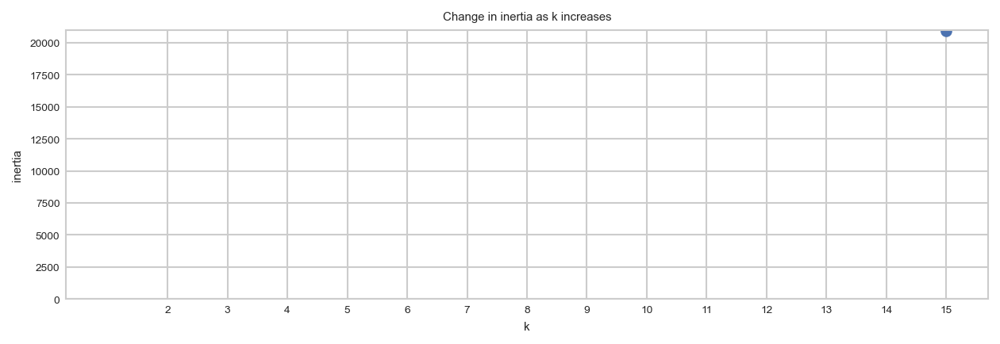

In [52]:
# KMeans Elbow-method

with plt.style.context('seaborn-whitegrid'):

    plt.figure(figsize = (10, 3))
    pd.Series({k: KMeans(k).fit(X_majors).inertia_ for k in range(1, 16)}).plot(marker = 'o')
    plt.xticks(range(16, 35))
    
    plt.ylim(0, 21000)
    plt.xlabel('k')
    plt.ylabel('inertia')
    plt.title('Change in inertia as k increases')

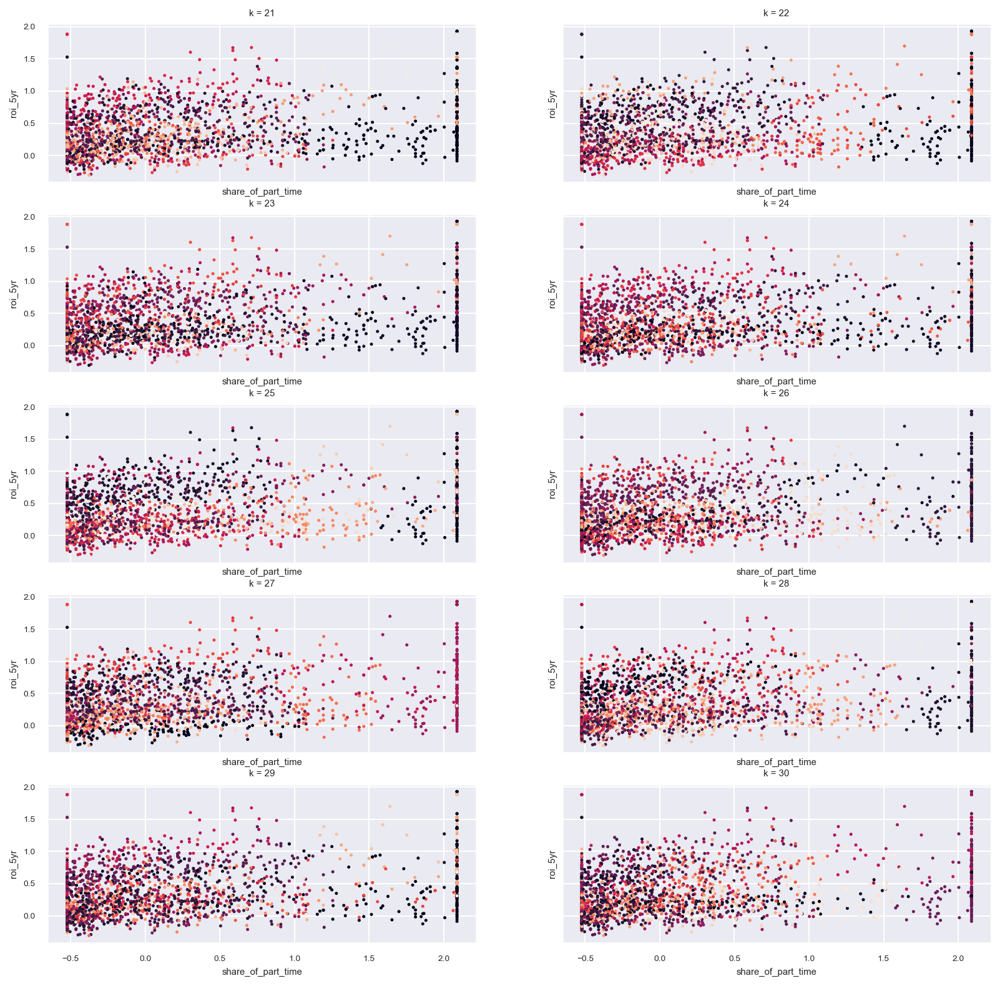

In [53]:
# plotting inertia for number of KMeans clusters

fig, axs = plt.subplots(5, 2, figsize=(13, 13), sharex=True, sharey=True)

for ax, k in zip(axs.ravel(), range(21, 31)):
    
    X5 = X_majors.sample(2000, random_state = 123)

    # creating and fitting KMeans
    clusters = KMeans(k).fit(X5).predict(X5)

    X5["roi_5yr"] = train_scaled["roi_5yr"]

    ax.scatter(
        X5["share_of_part_time"],
        X5["roi_5yr"],
        c = clusters,
        s = 2)

    ax.set(title='k = {}'.format(k), xlabel = 'share_of_part_time', ylabel = 'roi_5yr')

In [54]:
ref_coeff = 0

for n_cluster in range(2, 38):

    kmeans = KMeans(n_clusters = n_cluster).fit(X5)

    label = kmeans.labels_

    sil_coeff = silhouette_score(X5, label, metric = 'euclidean')
    rel_coeff = (sil_coeff - ref_coeff)/ref_coeff
    ref_coeff = sil_coeff
    print("For n_clusters = {}, The Relative Silhouette Coefficient is {:.4f} and relative difference of {:.3f}".format(n_cluster, sil_coeff, rel_coeff))

For n_clusters = 2, The Relative Silhouette Coefficient is 0.3283 and relative difference of inf
For n_clusters = 3, The Relative Silhouette Coefficient is 0.1489 and relative difference of -0.547
For n_clusters = 4, The Relative Silhouette Coefficient is 0.1579 and relative difference of 0.061
For n_clusters = 5, The Relative Silhouette Coefficient is 0.1897 and relative difference of 0.202
For n_clusters = 6, The Relative Silhouette Coefficient is 0.2032 and relative difference of 0.071
For n_clusters = 7, The Relative Silhouette Coefficient is 0.2291 and relative difference of 0.128
For n_clusters = 8, The Relative Silhouette Coefficient is 0.2709 and relative difference of 0.182
For n_clusters = 9, The Relative Silhouette Coefficient is 0.2624 and relative difference of -0.031
For n_clusters = 10, The Relative Silhouette Coefficient is 0.3046 and relative difference of 0.161
For n_clusters = 11, The Relative Silhouette Coefficient is 0.3096 and relative difference of 0.017
For n_cl

In [55]:
# fitting of KMeans cluster

kmeans = KMeans(n_clusters = 30)
kmeans.fit(X_majors)

train_clusters = kmeans.predict(X_majors)

In [56]:
# creating cluster for ea. dataset 

train_majors_clusters_5yr = kmeans.predict(X_majors)
val_majors_clusters_5yr = kmeans.predict(X_val)
test_majors_clusters_5yr = kmeans.predict(X_test)

# viewing cluster samples
pd.DataFrame(train_majors_clusters_5yr).rename(columns = {0: "Cluster Sample"}).sample(10, random_state = 123)

,Cluster Sample
21417,26
28667,5
7477,3
24935,17
24966,14
7142,5
30603,23
7930,1
31203,2
1107,9


In [57]:
# adding clusters back to original datasets

train_scaled["major_clusters_5yr"] = train_majors_clusters_5yr
validate_scaled["major_clusters_5yr"] = val_majors_clusters_5yr
test_scaled["major_clusters_5yr"] = test_majors_clusters_5yr

train_scaled.head()

,unit_id_institution,college_name,state_post_code,zip_code,city,region_ipeds,title_IV_eligibility,pred_degree,pred_degree_0and4,degree_name,degree_code,major_code,major_name,branch_number,avg_net_price_public,avg_net_price_private,full_time_net_tuition_revenue,off_campus_cost_of_attendace,on_campus_cost_of_attendace,admission_rate,graduate_number,ACT_score_mid,avg_sat_admitted,required_score,avg_faculty_salary,online_only,comp_rt_ft_150over_expected_time,comp_rt_ft_150over_expected_time_two_races,comp_rt_ft_150over_expected_time_native_american,comp_rt_ft_150over_expected_time_asian,comp_rt_ft_150over_expected_time_black,comp_rt_ft_150over_expected_time_hispanic,comp_rt_ft_150over_expected_time_non_resident,comp_rt_ft_150over_expected_time_unknown_race,comp_rt_ft_150over_expected_time_white,share_entering_students_first_ft,share_of_part_time,first_time_ft_student_retention,first_time_pt_student_retention,enrollment_share_two_races,enrollment_share_native_american,enrollment_share_asian,enrollment_share_black,enrollment_share_hispanic,enrollment_share_pac_islander,enrollment_share_non_resident,enrollment_share_unknown,enrollment_share_white,undergraduate_number_pell_grant_fedral_loan,med_debt_pell_students,median_debt_completed,median_debt_non_first_generation,median_debt_non_pell,fedral_loan_full_time_first_time_undergraduate,pell_grant_full_time_first_time_undergraduate,deg_percent_awarded_agriculture_operations,deg_percent_awarded_natural_resources,deg_percent_awarded_architecture,deg_percent_awarded_area_ethnic_cultural_gender,deg_percent_awarded_communication_journalism,deg_percent_awarded_communication_tech,deg_percent_awarded_computer_science,deg_percent_awarded_personal_culinary_services,deg_percent_awarded_education,deg_percent_awarded_engineering,deg_percent_awarded_engineering_tech,deg_percent_awarded_foreign_language_literatures,deg_percent_awarded_human_science,deg_percent_awarded_legal_profession,deg_percent_awarded_english_lang,deg_percent_awarded_general_studies,deg_percent_awarded_library_sciences,deg_percent_awarded_bio_sciences,deg_percent_awarded_mathematics,deg_percent_awarded_military_tech,deg_percent_awarded_intedisciplinary_studies,deg_percent_awarded_leisure_fitness,deg_percent_awarded_philosophy,deg_percent_awarded_theology,deg_percent_awarded_physical_sciences,deg_percent_awarded_science_tech,deg_percent_awarded_psychology,deg_percent_awarded_homeland_security,deg_percent_awarded_public_admin,deg_percent_awarded_social_sciences,deg_percent_awarded_construction_trades,deg_percent_awarded_mechanic_repair,deg_percent_awarded_precision_production,deg_percent_awarded_transportation_materials,deg_percent_awarded_visual_and_performing_arts,deg_percent_awarded_health,deg_percent_awarded_business_management,deg_percent_awarded_history,non_deg_seeking,avg_net_price,2017,2018,2019,Grand Total,roi_5yr,pct_roi_5yr,roi_10yr,pct_roi_10yr,roi_20yr,pct_roi_20yr,income_0_30000,income_30001_48000,income_48001_75000,income_75001_110000,income_over_110000,major_category_Agriculture,major_category_Architecture,"major_category_Area, Ethnic, and Civilization Studies",major_category_Biology and Life Sciences,major_category_Business,major_category_Communication Technologies,major_category_Communications,major_category_Computer and Information Sciences,major_category_Construction Services,major_category_Cosmetology Services and Culinary Arts,major_category_Criminal Justice and Fire Protection,major_category_Education Administration and Teaching,major_category_Electrical and Mechanic Repairs and Technologies,major_category_Engineering,major_category_Engineering Technologies,"major_category_English Language, Literature, and Composition",major_category_Environment and Natural Resources,major_category_Family and Consumer Sciences,major_category_Fine Arts,major_category_History,major_category_Interdisciplinary and Multi-Disciplinary Studies (General),major_category_Law,major_category_Liberal Arts and Humanities,major_category_Librar

In [58]:
# printing average admissions rate by control cluster

unique_clusters = sorted(train_scaled["major_clusters_5yr"].unique().tolist())

container = []

for cluster in unique_clusters:
    
    metric = {
    'major cluster': cluster,
    'share of part-time students': round(train_scaled[train_scaled["major_clusters_5yr"] == cluster]["share_of_part_time"].mean(), 3),
    'min 5YR ROI': round(train_scaled[train_scaled["major_clusters_5yr"] == cluster]["roi_5yr"].min(), 3),
    'max 5YR ROI': round(train_scaled[train_scaled["major_clusters_5yr"] == cluster]["roi_5yr"].max(), 3),
    'range of 5YR ROI': round((train_scaled[train_scaled["major_clusters_5yr"] == cluster]["roi_5yr"].max() - train_scaled[train_scaled["major_clusters_5yr"] == cluster]["roi_5yr"].min()), 2),
    'average 5YR ROI': round(train_scaled[train_scaled["major_clusters_5yr"] == cluster]["roi_5yr"].mean(), 3)
    }

    container.append(metric)

cluster_description = pd.DataFrame(container).sort_values(by = "average 5YR ROI", ascending = False).reset_index(drop = True)
cluster_description

,major cluster,share of part-time students,min 5YR ROI,max 5YR ROI,range of 5YR ROI,average 5YR ROI
0,21,1.800,0.418,1.969,1.55,1.284
1,1,1.961,0.244,1.604,1.36,1.102
2,10,-0.088,0.405,1.930,1.52,0.981
3,7,-0.071,0.287,1.883,1.60,0.960
4,22,0.621,0.129,1.529,1.40,0.803
5,6,-0.243,0.084,1.529,1.44,0.669
6,11,-0.139,0.191,1.484,1.29,0.646
7,28,2.029,-0.322,2.103,2.43,0.591
8,8,-0.083,0.113,1.358,1.24,0.580
9,18,1.724,-0.082,0.866,0.95,0.469


----
### ``Cluster Number 6: SAT Score Clusters``

In [59]:
# setting features to cluster on 

X_sat = train_scaled[[
    'undergraduate_number_pell_grant_fedral_loan',
    'SAT_binned_average_sat',
    'SAT_binned_above_average_sat',	
    'SAT_binned_competitive_sat',	
    'SAT_binned_very_competitive_sat'
    ]]

# validate df
X_val = validate_scaled[[
    'undergraduate_number_pell_grant_fedral_loan',
    'SAT_binned_average_sat',
    'SAT_binned_above_average_sat',	
    'SAT_binned_competitive_sat',	
    'SAT_binned_very_competitive_sat'    
    ]]

# test df
X_test = test_scaled[[
    'undergraduate_number_pell_grant_fedral_loan',
    'SAT_binned_average_sat',
    'SAT_binned_above_average_sat',	
    'SAT_binned_competitive_sat',	
    'SAT_binned_very_competitive_sat'    
    ]]

X_sat.head()

,undergraduate_number_pell_grant_fedral_loan,SAT_binned_average_sat,SAT_binned_above_average_sat,SAT_binned_competitive_sat,SAT_binned_very_competitive_sat
25530,1.270727,False,True,False,False
53875,-0.109832,True,False,False,False
42932,2.369975,False,True,False,False
45495,-0.250487,True,False,False,False
25003,-0.101755,False,False,False,True


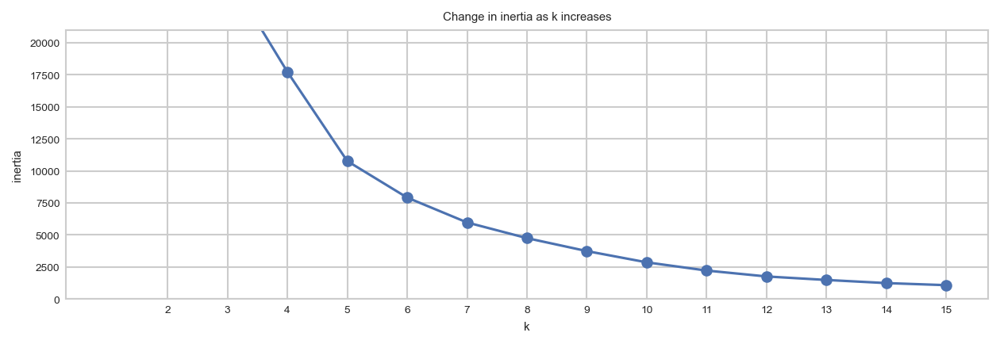

In [60]:
# KMeans Elbow-method

with plt.style.context('seaborn-whitegrid'):

    plt.figure(figsize = (10, 3))
    pd.Series({k: KMeans(k).fit(X_sat).inertia_ for k in range(1, 16)}).plot(marker = 'o')
    plt.xticks(range(2, 16))
    
    plt.ylim(0, 21000)
    plt.xlabel('k')
    plt.ylabel('inertia')
    plt.title('Change in inertia as k increases')

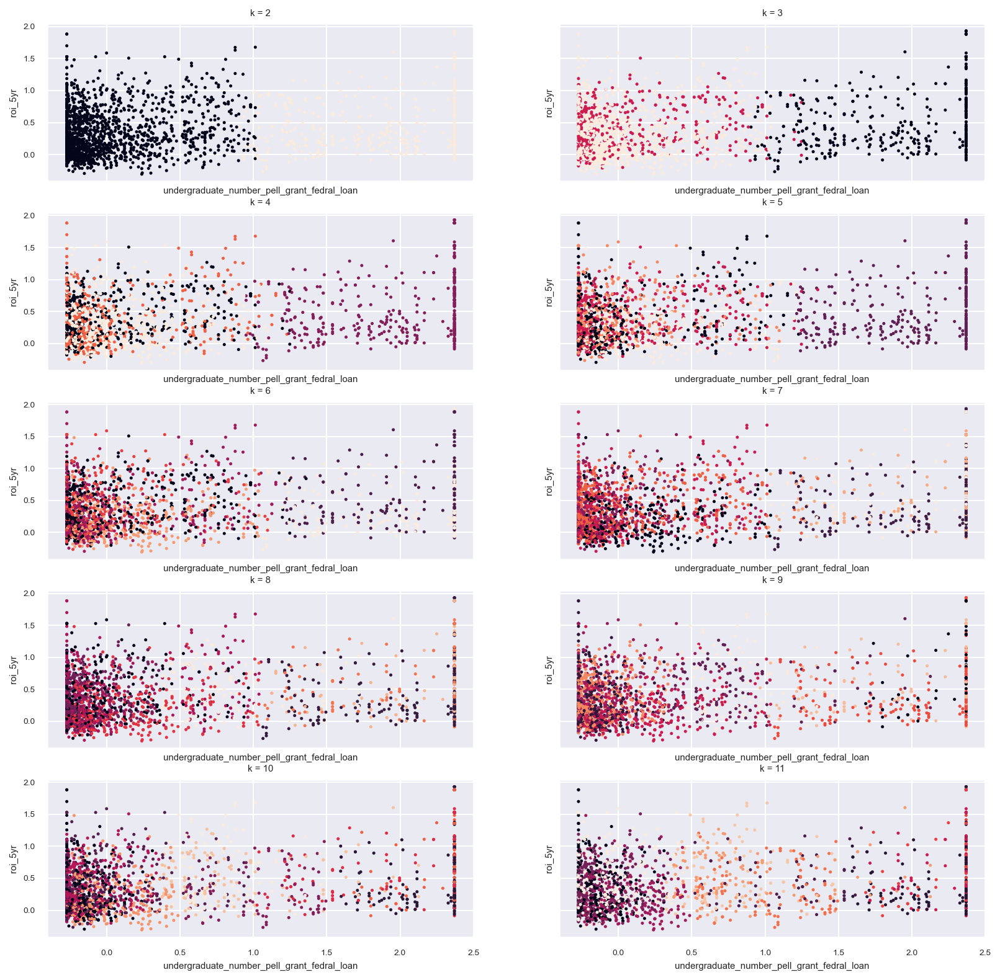

In [61]:
# plotting inertia for number of KMeans clusters

fig, axs = plt.subplots(5, 2, figsize=(13, 13), sharex=True, sharey=True)

for ax, k in zip(axs.ravel(), range(2, 16)):
    
    X6 = X_sat.sample(2000, random_state = 123)

    # creating and fitting KMeans
    clusters = KMeans(k).fit(X6).predict(X6)

    X6["roi_5yr"] = train_scaled["roi_5yr"]

    ax.scatter(
        X6["undergraduate_number_pell_grant_fedral_loan"],
        X6["roi_5yr"],
        c = clusters,
        s = 2)

    ax.set(title='k = {}'.format(k), xlabel = 'undergraduate_number_pell_grant_fedral_loan', ylabel = 'roi_5yr')

In [62]:
ref_coeff = 0

for n_cluster in range(2, 13):

    kmeans = KMeans(n_clusters = n_cluster).fit(X6)

    label = kmeans.labels_

    sil_coeff = silhouette_score(X6, label, metric = 'euclidean')
    rel_coeff = (sil_coeff - ref_coeff)/ref_coeff
    ref_coeff = sil_coeff
    print("For n_clusters = {}, The Relative Silhouette Coefficient is {:.4f} and relative difference of {:.3f}".format(n_cluster, sil_coeff, rel_coeff))

# obtaining the best coefficient results at n_clusters = 5: using sklearn silhouette coefficient method

For n_clusters = 2, The Relative Silhouette Coefficient is 0.4237 and relative difference of inf
For n_clusters = 3, The Relative Silhouette Coefficient is 0.3468 and relative difference of -0.182
For n_clusters = 4, The Relative Silhouette Coefficient is 0.4554 and relative difference of 0.313
For n_clusters = 5, The Relative Silhouette Coefficient is 0.5478 and relative difference of 0.203
For n_clusters = 6, The Relative Silhouette Coefficient is 0.5534 and relative difference of 0.010
For n_clusters = 7, The Relative Silhouette Coefficient is 0.5729 and relative difference of 0.035
For n_clusters = 8, The Relative Silhouette Coefficient is 0.5532 and relative difference of -0.034
For n_clusters = 9, The Relative Silhouette Coefficient is 0.5468 and relative difference of -0.012
For n_clusters = 10, The Relative Silhouette Coefficient is 0.5312 and relative difference of -0.028
For n_clusters = 11, The Relative Silhouette Coefficient is 0.5005 and relative difference of -0.058
For n

In [63]:
# fitting of KMeans cluster

kmeans = KMeans(n_clusters = 4)
kmeans.fit(X_sat)

train_clusters = kmeans.predict(X_sat)

In [64]:
# creating cluster for ea. dataset 

train_sat_clusters_5yr = kmeans.predict(X_sat)
val_sat_clusters_5yr = kmeans.predict(X_val)
test_sat_clusters_5yr = kmeans.predict(X_test)

# viewing cluster samples
pd.DataFrame(train_sat_clusters_5yr).rename(columns = {0: "Cluster Sample"}).sample(10, random_state = 123)

,Cluster Sample
21417,3
28667,2
7477,3
24935,0
24966,0
7142,0
30603,3
7930,2
31203,2
1107,0


In [65]:
# adding clusters back to original datasets

train_scaled["sat_clusters_5yr"] = train_sat_clusters_5yr
validate_scaled["sat_clusters_5yr"] = val_sat_clusters_5yr
test_scaled["sat_clusters_5yr"] = test_sat_clusters_5yr

train_scaled.head()

,unit_id_institution,college_name,state_post_code,zip_code,city,region_ipeds,title_IV_eligibility,pred_degree,pred_degree_0and4,degree_name,degree_code,major_code,major_name,branch_number,avg_net_price_public,avg_net_price_private,full_time_net_tuition_revenue,off_campus_cost_of_attendace,on_campus_cost_of_attendace,admission_rate,graduate_number,ACT_score_mid,avg_sat_admitted,required_score,avg_faculty_salary,online_only,comp_rt_ft_150over_expected_time,comp_rt_ft_150over_expected_time_two_races,comp_rt_ft_150over_expected_time_native_american,comp_rt_ft_150over_expected_time_asian,comp_rt_ft_150over_expected_time_black,comp_rt_ft_150over_expected_time_hispanic,comp_rt_ft_150over_expected_time_non_resident,comp_rt_ft_150over_expected_time_unknown_race,comp_rt_ft_150over_expected_time_white,share_entering_students_first_ft,share_of_part_time,first_time_ft_student_retention,first_time_pt_student_retention,enrollment_share_two_races,enrollment_share_native_american,enrollment_share_asian,enrollment_share_black,enrollment_share_hispanic,enrollment_share_pac_islander,enrollment_share_non_resident,enrollment_share_unknown,enrollment_share_white,undergraduate_number_pell_grant_fedral_loan,med_debt_pell_students,median_debt_completed,median_debt_non_first_generation,median_debt_non_pell,fedral_loan_full_time_first_time_undergraduate,pell_grant_full_time_first_time_undergraduate,deg_percent_awarded_agriculture_operations,deg_percent_awarded_natural_resources,deg_percent_awarded_architecture,deg_percent_awarded_area_ethnic_cultural_gender,deg_percent_awarded_communication_journalism,deg_percent_awarded_communication_tech,deg_percent_awarded_computer_science,deg_percent_awarded_personal_culinary_services,deg_percent_awarded_education,deg_percent_awarded_engineering,deg_percent_awarded_engineering_tech,deg_percent_awarded_foreign_language_literatures,deg_percent_awarded_human_science,deg_percent_awarded_legal_profession,deg_percent_awarded_english_lang,deg_percent_awarded_general_studies,deg_percent_awarded_library_sciences,deg_percent_awarded_bio_sciences,deg_percent_awarded_mathematics,deg_percent_awarded_military_tech,deg_percent_awarded_intedisciplinary_studies,deg_percent_awarded_leisure_fitness,deg_percent_awarded_philosophy,deg_percent_awarded_theology,deg_percent_awarded_physical_sciences,deg_percent_awarded_science_tech,deg_percent_awarded_psychology,deg_percent_awarded_homeland_security,deg_percent_awarded_public_admin,deg_percent_awarded_social_sciences,deg_percent_awarded_construction_trades,deg_percent_awarded_mechanic_repair,deg_percent_awarded_precision_production,deg_percent_awarded_transportation_materials,deg_percent_awarded_visual_and_performing_arts,deg_percent_awarded_health,deg_percent_awarded_business_management,deg_percent_awarded_history,non_deg_seeking,avg_net_price,2017,2018,2019,Grand Total,roi_5yr,pct_roi_5yr,roi_10yr,pct_roi_10yr,roi_20yr,pct_roi_20yr,income_0_30000,income_30001_48000,income_48001_75000,income_75001_110000,income_over_110000,major_category_Agriculture,major_category_Architecture,"major_category_Area, Ethnic, and Civilization Studies",major_category_Biology and Life Sciences,major_category_Business,major_category_Communication Technologies,major_category_Communications,major_category_Computer and Information Sciences,major_category_Construction Services,major_category_Cosmetology Services and Culinary Arts,major_category_Criminal Justice and Fire Protection,major_category_Education Administration and Teaching,major_category_Electrical and Mechanic Repairs and Technologies,major_category_Engineering,major_category_Engineering Technologies,"major_category_English Language, Literature, and Composition",major_category_Environment and Natural Resources,major_category_Family and Consumer Sciences,major_category_Fine Arts,major_category_History,major_category_Interdisciplinary and Multi-Disciplinary Studies (General),major_category_Law,major_category_Liberal Arts and Humanities,major_category_Librar

In [66]:
# printing undergraduate pell grant loan rate by admitted SAT

unique_clusters = sorted(train_scaled["sat_clusters_5yr"].unique().tolist())

container = []

for cluster in unique_clusters:
    
    metric = {
    'major cluster': cluster,
    'undergrad federal loan': round(train_scaled[train_scaled["sat_clusters_5yr"] == cluster]["undergraduate_number_pell_grant_fedral_loan"].mean(), 3),
    'min 5YR ROI': round(train_scaled[train_scaled["sat_clusters_5yr"] == cluster]["roi_5yr"].min(), 3),
    'max 5YR ROI': round(train_scaled[train_scaled["sat_clusters_5yr"] == cluster]["roi_5yr"].max(), 3),
    'range of 5YR ROI': round((train_scaled[train_scaled["sat_clusters_5yr"] == cluster]["roi_5yr"].max() - train_scaled[train_scaled["sat_clusters_5yr"] == cluster]["roi_5yr"].min()), 2),
    'average 5YR ROI': round(train_scaled[train_scaled["sat_clusters_5yr"] == cluster]["roi_5yr"].mean(), 3)
    }

    container.append(metric)

cluster_description = pd.DataFrame(container).sort_values(by = "average 5YR ROI", ascending = False).reset_index(drop = True)
cluster_description

,major cluster,undergrad federal loan,min 5YR ROI,max 5YR ROI,range of 5YR ROI,average 5YR ROI
0,1,1.979,-0.339,2.103,2.44,0.566
1,2,-0.036,-0.385,2.103,2.49,0.394
2,0,0.043,-0.295,1.787,2.08,0.372
3,3,0.064,-0.382,1.969,2.35,0.309


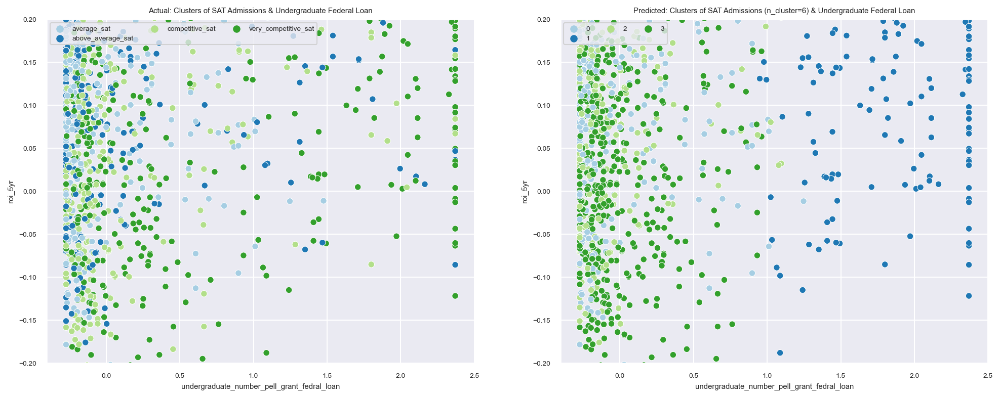

In [67]:
# seeing how month clusters compare against actual month and home age

sns.set(font_scale = 0.6)
plt.subplots(1, 2, figsize = (16, 6), sharex = False, sharey = False)

plt.subplot(121)
sns.scatterplot(
        x = "undergraduate_number_pell_grant_fedral_loan",
        y = "roi_5yr",
        data = train_imputed.sample(2500, random_state = 123), 
        hue = "SAT_binned",
        palette = ['#a6cee3','#1f78b4','#b2df8a','#33a02c']
)

plt.title("Actual: Clusters of SAT Admissions & Undergraduate Federal Loan")
plt.legend(loc = 'upper left', ncol = 3)
plt.ylim(-.2, .2)

plt.subplot(122)
sns.scatterplot(
        x = "undergraduate_number_pell_grant_fedral_loan",
        y = "roi_5yr",
        data = train_scaled.sample(2500, random_state = 123), 
        hue = "sat_clusters_5yr",
        palette = ['#a6cee3','#1f78b4','#b2df8a','#33a02c']
)

plt.title("Predicted: Clusters of SAT Admissions (n_cluster=6) & Undergraduate Federal Loan")
plt.legend(loc = 'upper left', ncol = 3)
plt.ylim(-.2, .2)
plt.show()

----
### ``Modeling Pre-processing``


In [68]:
# creating dummy dataframes with generated clusters for modeling

train_model, validate_model, test_model = prepare.get_cluster_dummy(train_scaled, validate_scaled, test_scaled)
print(f'dataframe shape: {train_model.shape}')
train_model.head()

dataframe shape: (39995, 230)


,unit_id_institution,college_name,state_post_code,zip_code,city,region_ipeds,title_IV_eligibility,pred_degree,pred_degree_0and4,degree_name,degree_code,major_code,major_name,branch_number,avg_net_price_public,avg_net_price_private,full_time_net_tuition_revenue,off_campus_cost_of_attendace,on_campus_cost_of_attendace,admission_rate,graduate_number,ACT_score_mid,avg_sat_admitted,required_score,avg_faculty_salary,online_only,comp_rt_ft_150over_expected_time,comp_rt_ft_150over_expected_time_two_races,comp_rt_ft_150over_expected_time_native_american,comp_rt_ft_150over_expected_time_asian,comp_rt_ft_150over_expected_time_black,comp_rt_ft_150over_expected_time_hispanic,comp_rt_ft_150over_expected_time_non_resident,comp_rt_ft_150over_expected_time_unknown_race,comp_rt_ft_150over_expected_time_white,share_entering_students_first_ft,share_of_part_time,first_time_ft_student_retention,first_time_pt_student_retention,enrollment_share_two_races,enrollment_share_native_american,enrollment_share_asian,enrollment_share_black,enrollment_share_hispanic,enrollment_share_pac_islander,enrollment_share_non_resident,enrollment_share_unknown,enrollment_share_white,undergraduate_number_pell_grant_fedral_loan,med_debt_pell_students,median_debt_completed,median_debt_non_first_generation,median_debt_non_pell,fedral_loan_full_time_first_time_undergraduate,pell_grant_full_time_first_time_undergraduate,deg_percent_awarded_agriculture_operations,deg_percent_awarded_natural_resources,deg_percent_awarded_architecture,deg_percent_awarded_area_ethnic_cultural_gender,deg_percent_awarded_communication_journalism,deg_percent_awarded_communication_tech,deg_percent_awarded_computer_science,deg_percent_awarded_personal_culinary_services,deg_percent_awarded_education,deg_percent_awarded_engineering,deg_percent_awarded_engineering_tech,deg_percent_awarded_foreign_language_literatures,deg_percent_awarded_human_science,deg_percent_awarded_legal_profession,deg_percent_awarded_english_lang,deg_percent_awarded_general_studies,deg_percent_awarded_library_sciences,deg_percent_awarded_bio_sciences,deg_percent_awarded_mathematics,deg_percent_awarded_military_tech,deg_percent_awarded_intedisciplinary_studies,deg_percent_awarded_leisure_fitness,deg_percent_awarded_philosophy,deg_percent_awarded_theology,deg_percent_awarded_physical_sciences,deg_percent_awarded_science_tech,deg_percent_awarded_psychology,deg_percent_awarded_homeland_security,deg_percent_awarded_public_admin,deg_percent_awarded_social_sciences,deg_percent_awarded_construction_trades,deg_percent_awarded_mechanic_repair,deg_percent_awarded_precision_production,deg_percent_awarded_transportation_materials,deg_percent_awarded_visual_and_performing_arts,deg_percent_awarded_health,deg_percent_awarded_business_management,deg_percent_awarded_history,non_deg_seeking,avg_net_price,2017,2018,2019,Grand Total,roi_5yr,pct_roi_5yr,roi_10yr,pct_roi_10yr,roi_20yr,pct_roi_20yr,income_0_30000,income_30001_48000,income_48001_75000,income_75001_110000,income_over_110000,major_category_Agriculture,major_category_Architecture,"major_category_Area, Ethnic, and Civilization Studies",major_category_Biology and Life Sciences,major_category_Business,major_category_Communication Technologies,major_category_Communications,major_category_Computer and Information Sciences,major_category_Construction Services,major_category_Cosmetology Services and Culinary Arts,major_category_Criminal Justice and Fire Protection,major_category_Education Administration and Teaching,major_category_Electrical and Mechanic Repairs and Technologies,major_category_Engineering,major_category_Engineering Technologies,"major_category_English Language, Literature, and Composition",major_category_Environment and Natural Resources,major_category_Family and Consumer Sciences,major_category_Fine Arts,major_category_History,major_category_Interdisciplinary and Multi-Disciplinary Studies (General),major_category_Law,major_category_Liberal Arts and Humanities,major_category_Librar

In [69]:
# establish a baseline for comparison

prepare.establish_baseline(train_model, validate_model)

Train baseline RMSE: 0.41
Validate baseline RMSE: 0.41

train shape: (39995, 230)
validate shape: (17142, 230)


In [ ]:
# create copies 
train_model_actual = train_model.copy()
validate_model_actual = validate_model.copy()

In [ ]:
X_train = train_model[[
    'off_campus_cost_of_attendace',
    'on_campus_cost_of_attendace',
    'graduate_number',
    'ACT_score_mid',
    'required_score',
    'online_only',
    'comp_rt_ft_150over_expected_time',
    'comp_rt_ft_150over_expected_time_two_races',
    'comp_rt_ft_150over_expected_time_native_american',
    'comp_rt_ft_150over_expected_time_asian',
    'comp_rt_ft_150over_expected_time_black',
    'comp_rt_ft_150over_expected_time_hispanic',
    'comp_rt_ft_150over_expected_time_non_resident',
    'comp_rt_ft_150over_expected_time_unknown_race',
    'comp_rt_ft_150over_expected_time_white',
    'share_of_part_time',
    'first_time_ft_student_retention',
    'first_time_pt_student_retention',
    'enrollment_share_two_races',
    'enrollment_share_native_american',
    'enrollment_share_asian',
    'enrollment_share_black',
    'enrollment_share_hispanic',
    'enrollment_share_pac_islander',
    'enrollment_share_non_resident',
    'enrollment_share_unknown',
    'enrollment_share_white',
    'med_debt_pell_students',
    'median_debt_completed',
    # 'median_debt_non_first_generation',
    'median_debt_non_pell',
    'fedral_loan_full_time_first_time_undergraduate',
    'pell_grant_full_time_first_time_undergraduate',
    'deg_percent_awarded_agriculture_operations',
    'deg_percent_awarded_natural_resources',
    'deg_percent_awarded_architecture',
    'deg_percent_awarded_area_ethnic_cultural_gender',
    'deg_percent_awarded_communication_journalism',
    'deg_percent_awarded_communication_tech',
    'deg_percent_awarded_computer_science',
    'deg_percent_awarded_personal_culinary_services',
    'deg_percent_awarded_education',
    'deg_percent_awarded_engineering',
    'deg_percent_awarded_engineering_tech',
    'deg_percent_awarded_foreign_language_literatures',
    'deg_percent_awarded_human_science',
    'deg_percent_awarded_legal_profession',
    'deg_percent_awarded_english_lang',
    'deg_percent_awarded_general_studies',
    'deg_percent_awarded_library_sciences',
    'deg_percent_awarded_bio_sciences',
    'deg_percent_awarded_mathematics',
    'deg_percent_awarded_military_tech',
    'deg_percent_awarded_intedisciplinary_studies',
    'deg_percent_awarded_leisure_fitness',
    'deg_percent_awarded_philosophy',
    'deg_percent_awarded_theology',
    'deg_percent_awarded_physical_sciences',
    'deg_percent_awarded_science_tech',
    'deg_percent_awarded_psychology',
    'deg_percent_awarded_homeland_security',
    'deg_percent_awarded_public_admin',
    'deg_percent_awarded_social_sciences',
    'deg_percent_awarded_construction_trades',
    'deg_percent_awarded_mechanic_repair',
    'deg_percent_awarded_precision_production',
    'deg_percent_awarded_transportation_materials',
    'deg_percent_awarded_visual_and_performing_arts',
    'deg_percent_awarded_health',
    'deg_percent_awarded_business_management',
    'deg_percent_awarded_history',
    'non_deg_seeking',
    'income_0_30000',
    'income_30001_48000',
    'income_75001_110000',
    'income_over_110000',
    'major_category_Agriculture',
    'major_category_Architecture',
    'major_category_Area, Ethnic, and Civilization Studies',
    'major_category_Biology and Life Sciences',
    'major_category_Business',
    'major_category_Communication Technologies',
    'major_category_Communications',
    'major_category_Computer and Information Sciences',
    'major_category_Construction Services',
    'major_category_Cosmetology Services and Culinary Arts',
    'major_category_Criminal Justice and Fire Protection',
    'major_category_Education Administration and Teaching',
    'major_category_Electrical and Mechanic Repairs and Technologies',
    'major_category_Engineering',
    'major_category_Engineering Technologies',
    'major_category_English Language, Literature, and Composition',
    'major_category_Environment and Natural Resources',
    'major_category_Family and Consumer Sciences',
    'major_category_Fine Arts',
    'major_category_History',
    'major_category_Interdisciplinary and Multi-Disciplinary Studies (General)',
    'major_category_Law',
    'major_category_Liberal Arts and Humanities',
    'major_category_Library Science',
    'major_category_Linguistics and Foreign Languages',
    'major_category_Mathematics and Statistics',
    'major_category_Medical and Health Sciences and Services',
    'major_category_Military Technologies',
    'major_category_Nuclear, Industrial Radiology, and Biological Technologies',
    'major_category_Philosophy and Religious Studies',
    'major_category_Physical Fitness, Parks, Recreation, and Leisure',
    'major_category_Physical Sciences',
    'major_category_Psychology',
    'major_category_Public Affairs, Policy, and Social Work',
    'major_category_Social Sciences',
    'major_category_Theology and Religious Vocations',
    'major_category_Transportation Sciences and Technologies',
    'share_entering_ft_binned_below_average',
    'share_entering_ft_binned_average',
    'share_entering_ft_binned_above_average',
    'share_entering_ft_binned_highest_average',
    'institution_control_Foreign',
    'institution_control_Private, for-profit',
    'institution_control_Private, nonprofit',
    'institution_control_Public',
    'us_region_east_north_atlantic',
    'us_region_east_north_central',
    'us_region_east_south_atlantic',
    'us_region_east_south_central',
    'us_region_midwest_north_central',
    'us_region_midwest_south_central',
    'us_region_us_foreign',
    'us_region_west_mountain',
    'us_region_west_pacific',
    'admission_rate_binned_very_competitive',
    'admission_rate_binned_somewhat_competitive',
    'admission_rate_binned_competitive',
    'admission_rate_binned_average_acceptance',
    'admission_rate_binned_above_average_acceptance',
    'SAT_binned_average_sat',
    'SAT_binned_above_average_sat',
    'SAT_binned_competitive_sat',
    'SAT_binned_very_competitive_sat',
    'admission_clusters_5yr_0',
    'admission_clusters_5yr_1',
    'admission_clusters_5yr_2',
    'admission_clusters_5yr_3',
    'admission_clusters_5yr_4',
    'control_clusters_5yr_0',
    'control_clusters_5yr_1',
    'control_clusters_5yr_2',
    'region_clusters_5yr_0',
    'region_clusters_5yr_1',
    'region_clusters_5yr_2',
    'region_clusters_5yr_3',
    'region_clusters_5yr_4',
    'region_clusters_5yr_5',
    'region_clusters_5yr_6',
    'region_clusters_5yr_7',
    'region_clusters_5yr_8',
    'ft_clusters_5yr_0',
    'ft_clusters_5yr_1',
    'ft_clusters_5yr_2',
    'ft_clusters_5yr_3',
    'ft_clusters_5yr_4',
    'ft_clusters_5yr_5',
    'major_clusters_5yr_0',
    'major_clusters_5yr_1',
    'major_clusters_5yr_2',
    'major_clusters_5yr_3',
    'major_clusters_5yr_4',
    'major_clusters_5yr_5',
    'major_clusters_5yr_6',
    'major_clusters_5yr_7',
    'major_clusters_5yr_8',
    'major_clusters_5yr_9',
    'major_clusters_5yr_10',
    'major_clusters_5yr_11',
    'major_clusters_5yr_12',
    'major_clusters_5yr_13',
    'major_clusters_5yr_14',
    'major_clusters_5yr_15',
    'major_clusters_5yr_16',
    'major_clusters_5yr_17',
    'major_clusters_5yr_18',
    'major_clusters_5yr_19',
    'major_clusters_5yr_20',
    'major_clusters_5yr_21',
    'major_clusters_5yr_22',
    'major_clusters_5yr_23',
    'major_clusters_5yr_24',
    'major_clusters_5yr_25',
    'major_clusters_5yr_26',
    'major_clusters_5yr_27',
    'major_clusters_5yr_28',
    'major_clusters_5yr_29',
    'sat_clusters_5yr_0',
    'sat_clusters_5yr_1',
    'sat_clusters_5yr_2',
    'sat_clusters_5yr_3']]

y_train = train_model["roi_5yr"]

# validate dataset
X_validate = validate_model[[
    'off_campus_cost_of_attendace',
    'on_campus_cost_of_attendace',
    'graduate_number',
    'ACT_score_mid',
    'required_score',
    'online_only',
    'comp_rt_ft_150over_expected_time',
    'comp_rt_ft_150over_expected_time_two_races',
    'comp_rt_ft_150over_expected_time_native_american',
    'comp_rt_ft_150over_expected_time_asian',
    'comp_rt_ft_150over_expected_time_black',
    'comp_rt_ft_150over_expected_time_hispanic',
    'comp_rt_ft_150over_expected_time_non_resident',
    'comp_rt_ft_150over_expected_time_unknown_race',
    'comp_rt_ft_150over_expected_time_white',
    'share_of_part_time',
    'first_time_ft_student_retention',
    'first_time_pt_student_retention',
    'enrollment_share_two_races',
    'enrollment_share_native_american',
    'enrollment_share_asian',
    'enrollment_share_black',
    'enrollment_share_hispanic',
    'enrollment_share_pac_islander',
    'enrollment_share_non_resident',
    'enrollment_share_unknown',
    'enrollment_share_white',
    'med_debt_pell_students',
    'median_debt_completed',
    'median_debt_non_pell',
    'fedral_loan_full_time_first_time_undergraduate',
    'pell_grant_full_time_first_time_undergraduate',
    'deg_percent_awarded_agriculture_operations',
    'deg_percent_awarded_natural_resources',
    'deg_percent_awarded_architecture',
    'deg_percent_awarded_area_ethnic_cultural_gender',
    'deg_percent_awarded_communication_journalism',
    'deg_percent_awarded_communication_tech',
    'deg_percent_awarded_computer_science',
    'deg_percent_awarded_personal_culinary_services',
    'deg_percent_awarded_education',
    'deg_percent_awarded_engineering',
    'deg_percent_awarded_engineering_tech',
    'deg_percent_awarded_foreign_language_literatures',
    'deg_percent_awarded_human_science',
    'deg_percent_awarded_legal_profession',
    'deg_percent_awarded_english_lang',
    'deg_percent_awarded_general_studies',
    'deg_percent_awarded_library_sciences',
    'deg_percent_awarded_bio_sciences',
    'deg_percent_awarded_mathematics',
    'deg_percent_awarded_military_tech',
    'deg_percent_awarded_intedisciplinary_studies',
    'deg_percent_awarded_leisure_fitness',
    'deg_percent_awarded_philosophy',
    'deg_percent_awarded_theology',
    'deg_percent_awarded_physical_sciences',
    'deg_percent_awarded_science_tech',
    'deg_percent_awarded_psychology',
    'deg_percent_awarded_homeland_security',
    'deg_percent_awarded_public_admin',
    'deg_percent_awarded_social_sciences',
    'deg_percent_awarded_construction_trades',
    'deg_percent_awarded_mechanic_repair',
    'deg_percent_awarded_precision_production',
    'deg_percent_awarded_transportation_materials',
    'deg_percent_awarded_visual_and_performing_arts',
    'deg_percent_awarded_health',
    'deg_percent_awarded_business_management',
    'deg_percent_awarded_history',
    'non_deg_seeking',
    'income_0_30000',
    'income_30001_48000',
    'income_75001_110000',
    'income_over_110000',
    'major_category_Agriculture',
    'major_category_Architecture',
    'major_category_Area, Ethnic, and Civilization Studies',
    'major_category_Biology and Life Sciences',
    'major_category_Business',
    'major_category_Communication Technologies',
    'major_category_Communications',
    'major_category_Computer and Information Sciences',
    'major_category_Construction Services',
    'major_category_Cosmetology Services and Culinary Arts',
    'major_category_Criminal Justice and Fire Protection',
    'major_category_Education Administration and Teaching',
    'major_category_Electrical and Mechanic Repairs and Technologies',
    'major_category_Engineering',
    'major_category_Engineering Technologies',
    'major_category_English Language, Literature, and Composition',
    'major_category_Environment and Natural Resources',
    'major_category_Family and Consumer Sciences',
    'major_category_Fine Arts',
    'major_category_History',
    'major_category_Interdisciplinary and Multi-Disciplinary Studies (General)',
    'major_category_Law',
    'major_category_Liberal Arts and Humanities',
    'major_category_Library Science',
    'major_category_Linguistics and Foreign Languages',
    'major_category_Mathematics and Statistics',
    'major_category_Medical and Health Sciences and Services',
    'major_category_Military Technologies',
    'major_category_Nuclear, Industrial Radiology, and Biological Technologies',
    'major_category_Philosophy and Religious Studies',
    'major_category_Physical Fitness, Parks, Recreation, and Leisure',
    'major_category_Physical Sciences',
    'major_category_Psychology',
    'major_category_Public Affairs, Policy, and Social Work',
    'major_category_Social Sciences',
    'major_category_Theology and Religious Vocations',
    'major_category_Transportation Sciences and Technologies',
    'share_entering_ft_binned_below_average',
    'share_entering_ft_binned_average',
    'share_entering_ft_binned_above_average',
    'share_entering_ft_binned_highest_average',
    'institution_control_Foreign',
    'institution_control_Private, for-profit',
    'institution_control_Private, nonprofit',
    'institution_control_Public',
    'us_region_east_north_atlantic',
    'us_region_east_north_central',
    'us_region_east_south_atlantic',
    'us_region_east_south_central',
    'us_region_midwest_north_central',
    'us_region_midwest_south_central',
    'us_region_us_foreign',
    'us_region_west_mountain',
    'us_region_west_pacific',
    'admission_rate_binned_very_competitive',
    'admission_rate_binned_somewhat_competitive',
    'admission_rate_binned_competitive',
    'admission_rate_binned_average_acceptance',
    'admission_rate_binned_above_average_acceptance',
    'SAT_binned_average_sat',
    'SAT_binned_above_average_sat',
    'SAT_binned_competitive_sat',
    'SAT_binned_very_competitive_sat',
    'admission_clusters_5yr_0',
    'admission_clusters_5yr_1',
    'admission_clusters_5yr_2',
    'admission_clusters_5yr_3',
    'admission_clusters_5yr_4',
    'control_clusters_5yr_0',
    'control_clusters_5yr_1',
    'control_clusters_5yr_2',
    'region_clusters_5yr_0',
    'region_clusters_5yr_1',
    'region_clusters_5yr_2',
    'region_clusters_5yr_3',
    'region_clusters_5yr_4',
    'region_clusters_5yr_5',
    'region_clusters_5yr_6',
    'region_clusters_5yr_7',
    'region_clusters_5yr_8',
    'ft_clusters_5yr_0',
    'ft_clusters_5yr_1',
    'ft_clusters_5yr_2',
    'ft_clusters_5yr_3',
    'ft_clusters_5yr_4',
    'ft_clusters_5yr_5',
    'major_clusters_5yr_0',
    'major_clusters_5yr_1',
    'major_clusters_5yr_2',
    'major_clusters_5yr_3',
    'major_clusters_5yr_4',
    'major_clusters_5yr_5',
    'major_clusters_5yr_6',
    'major_clusters_5yr_7',
    'major_clusters_5yr_8',
    'major_clusters_5yr_9',
    'major_clusters_5yr_10',
    'major_clusters_5yr_11',
    'major_clusters_5yr_12',
    'major_clusters_5yr_13',
    'major_clusters_5yr_14',
    'major_clusters_5yr_15',
    'major_clusters_5yr_16',
    'major_clusters_5yr_17',
    'major_clusters_5yr_18',
    'major_clusters_5yr_19',
    'major_clusters_5yr_20',
    'major_clusters_5yr_21',
    'major_clusters_5yr_22',
    'major_clusters_5yr_23',
    'major_clusters_5yr_24',
    'major_clusters_5yr_25',
    'major_clusters_5yr_26',
    'major_clusters_5yr_27',
    'major_clusters_5yr_28',
    'major_clusters_5yr_29',
    'sat_clusters_5yr_0',
    'sat_clusters_5yr_1',
    'sat_clusters_5yr_2',
    'sat_clusters_5yr_3']]

y_validate = validate_model["roi_5yr"]

# test dataset
X_test = validate_model[[
    'off_campus_cost_of_attendace',
    'on_campus_cost_of_attendace',
    'graduate_number',
    'ACT_score_mid',
    'required_score',
    'online_only',
    'comp_rt_ft_150over_expected_time',
    'comp_rt_ft_150over_expected_time_two_races',
    'comp_rt_ft_150over_expected_time_native_american',
    'comp_rt_ft_150over_expected_time_asian',
    'comp_rt_ft_150over_expected_time_black',
    'comp_rt_ft_150over_expected_time_hispanic',
    'comp_rt_ft_150over_expected_time_non_resident',
    'comp_rt_ft_150over_expected_time_unknown_race',
    'comp_rt_ft_150over_expected_time_white',
    'share_of_part_time',
    'first_time_ft_student_retention',
    'first_time_pt_student_retention',
    'enrollment_share_two_races',
    'enrollment_share_native_american',
    'enrollment_share_asian',
    'enrollment_share_black',
    'enrollment_share_hispanic',
    'enrollment_share_pac_islander',
    'enrollment_share_non_resident',
    'enrollment_share_unknown',
    'enrollment_share_white',
    'med_debt_pell_students',
    'median_debt_completed',
    'median_debt_non_pell',
    'fedral_loan_full_time_first_time_undergraduate',
    'pell_grant_full_time_first_time_undergraduate',
    'deg_percent_awarded_agriculture_operations',
    'deg_percent_awarded_natural_resources',
    'deg_percent_awarded_architecture',
    'deg_percent_awarded_area_ethnic_cultural_gender',
    'deg_percent_awarded_communication_journalism',
    'deg_percent_awarded_communication_tech',
    'deg_percent_awarded_computer_science',
    'deg_percent_awarded_personal_culinary_services',
    'deg_percent_awarded_education',
    'deg_percent_awarded_engineering',
    'deg_percent_awarded_engineering_tech',
    'deg_percent_awarded_foreign_language_literatures',
    'deg_percent_awarded_human_science',
    'deg_percent_awarded_legal_profession',
    'deg_percent_awarded_english_lang',
    'deg_percent_awarded_general_studies',
    'deg_percent_awarded_library_sciences',
    'deg_percent_awarded_bio_sciences',
    'deg_percent_awarded_mathematics',
    'deg_percent_awarded_military_tech',
    'deg_percent_awarded_intedisciplinary_studies',
    'deg_percent_awarded_leisure_fitness',
    'deg_percent_awarded_philosophy',
    'deg_percent_awarded_theology',
    'deg_percent_awarded_physical_sciences',
    'deg_percent_awarded_science_tech',
    'deg_percent_awarded_psychology',
    'deg_percent_awarded_homeland_security',
    'deg_percent_awarded_public_admin',
    'deg_percent_awarded_social_sciences',
    'deg_percent_awarded_construction_trades',
    'deg_percent_awarded_mechanic_repair',
    'deg_percent_awarded_precision_production',
    'deg_percent_awarded_transportation_materials',
    'deg_percent_awarded_visual_and_performing_arts',
    'deg_percent_awarded_health',
    'deg_percent_awarded_business_management',
    'deg_percent_awarded_history',
    'non_deg_seeking',
    'income_0_30000',
    'income_30001_48000',
    'income_75001_110000',
    'income_over_110000',
    'major_category_Agriculture',
    'major_category_Architecture',
    'major_category_Area, Ethnic, and Civilization Studies',
    'major_category_Biology and Life Sciences',
    'major_category_Business',
    'major_category_Communication Technologies',
    'major_category_Communications',
    'major_category_Computer and Information Sciences',
    'major_category_Construction Services',
    'major_category_Cosmetology Services and Culinary Arts',
    'major_category_Criminal Justice and Fire Protection',
    'major_category_Education Administration and Teaching',
    'major_category_Electrical and Mechanic Repairs and Technologies',
    'major_category_Engineering',
    'major_category_Engineering Technologies',
    'major_category_English Language, Literature, and Composition',
    'major_category_Environment and Natural Resources',
    'major_category_Family and Consumer Sciences',
    'major_category_Fine Arts',
    'major_category_History',
    'major_category_Interdisciplinary and Multi-Disciplinary Studies (General)',
    'major_category_Law',
    'major_category_Liberal Arts and Humanities',
    'major_category_Library Science',
    'major_category_Linguistics and Foreign Languages',
    'major_category_Mathematics and Statistics',
    'major_category_Medical and Health Sciences and Services',
    'major_category_Military Technologies',
    'major_category_Nuclear, Industrial Radiology, and Biological Technologies',
    'major_category_Philosophy and Religious Studies',
    'major_category_Physical Fitness, Parks, Recreation, and Leisure',
    'major_category_Physical Sciences',
    'major_category_Psychology',
    'major_category_Public Affairs, Policy, and Social Work',
    'major_category_Social Sciences',
    'major_category_Theology and Religious Vocations',
    'major_category_Transportation Sciences and Technologies',
    'share_entering_ft_binned_below_average',
    'share_entering_ft_binned_average',
    'share_entering_ft_binned_above_average',
    'share_entering_ft_binned_highest_average',
    'institution_control_Foreign',
    'institution_control_Private, for-profit',
    'institution_control_Private, nonprofit',
    'institution_control_Public',
    'us_region_east_north_atlantic',
    'us_region_east_north_central',
    'us_region_east_south_atlantic',
    'us_region_east_south_central',
    'us_region_midwest_north_central',
    'us_region_midwest_south_central',
    'us_region_us_foreign',
    'us_region_west_mountain',
    'us_region_west_pacific',
    'admission_rate_binned_very_competitive',
    'admission_rate_binned_somewhat_competitive',
    'admission_rate_binned_competitive',
    'admission_rate_binned_average_acceptance',
    'admission_rate_binned_above_average_acceptance',
    'SAT_binned_average_sat',
    'SAT_binned_above_average_sat',
    'SAT_binned_competitive_sat',
    'SAT_binned_very_competitive_sat',
    'admission_clusters_5yr_0',
    'admission_clusters_5yr_1',
    'admission_clusters_5yr_2',
    'admission_clusters_5yr_3',
    'admission_clusters_5yr_4',
    'control_clusters_5yr_0',
    'control_clusters_5yr_1',
    'control_clusters_5yr_2',
    'region_clusters_5yr_0',
    'region_clusters_5yr_1',
    'region_clusters_5yr_2',
    'region_clusters_5yr_3',
    'region_clusters_5yr_4',
    'region_clusters_5yr_5',
    'region_clusters_5yr_6',
    'region_clusters_5yr_7',
    'region_clusters_5yr_8',
    'ft_clusters_5yr_0',
    'ft_clusters_5yr_1',
    'ft_clusters_5yr_2',
    'ft_clusters_5yr_3',
    'ft_clusters_5yr_4',
    'ft_clusters_5yr_5',
    'major_clusters_5yr_0',
    'major_clusters_5yr_1',
    'major_clusters_5yr_2',
    'major_clusters_5yr_3',
    'major_clusters_5yr_4',
    'major_clusters_5yr_5',
    'major_clusters_5yr_6',
    'major_clusters_5yr_7',
    'major_clusters_5yr_8',
    'major_clusters_5yr_9',
    'major_clusters_5yr_10',
    'major_clusters_5yr_11',
    'major_clusters_5yr_12',
    'major_clusters_5yr_13',
    'major_clusters_5yr_14',
    'major_clusters_5yr_15',
    'major_clusters_5yr_16',
    'major_clusters_5yr_17',
    'major_clusters_5yr_18',
    'major_clusters_5yr_19',
    'major_clusters_5yr_20',
    'major_clusters_5yr_21',
    'major_clusters_5yr_22',
    'major_clusters_5yr_23',
    'major_clusters_5yr_24',
    'major_clusters_5yr_25',
    'major_clusters_5yr_26',
    'major_clusters_5yr_27',
    'major_clusters_5yr_28',
    'major_clusters_5yr_29',
    'sat_clusters_5yr_0',
    'sat_clusters_5yr_1',
    'sat_clusters_5yr_2',
    'sat_clusters_5yr_3']]

y_test = test_model["roi_5yr"]

In [ ]:
# number of feature in model df
X_train.shape[1]

195

In [ ]:
# using sklearn's RFECV function to select best features to include
# Lasso Lars

rfecv = RFECV(
    estimator = LassoLars(),
    min_features_to_select = 5)

rfecv = rfecv.fit(X_train, y_train)

feature_lst_lasso = X_train.columns[rfecv.support_].tolist()
print(f'number of features: {len(feature_lst_lasso)}')
pd.DataFrame(feature_lst_lasso).rename(columns = {0: "Features"}).sort_values("Features").reset_index(drop = True)

,Features
0,major_clusters_5yr_29
1,sat_clusters_5yr_0
2,sat_clusters_5yr_1
3,sat_clusters_5yr_2
4,sat_clusters_5yr_3


In [ ]:
# using sklearn's RFECV function to select best features to include
# Tweedie Regressor

rfecv = RFECV(
    estimator = TweedieRegressor(),
    min_features_to_select = 5)

rfecv = rfecv.fit(X_train, y_train)

feature_lst_tweedie = X_train.columns[rfecv.support_].tolist()
print(f'number of features: {len(feature_lst_tweedie)}')
pd.DataFrame(feature_lst_tweedie).rename(columns = {0: "Features"}).sort_values("Features").reset_index(drop = True)

number of features: 184


,Features
0,ACT_score_mid
1,SAT_binned_above_average_sat
2,SAT_binned_average_sat
3,SAT_binned_competitive_sat
4,SAT_binned_very_competitive_sat
5,admission_clusters_5yr_0
6,admission_clusters_5yr_1
7,admission_clusters_5yr_2
8,admission_clusters_5yr_3
9,admission_clusters_5yr_4


In [ ]:
# using sklearn's RFECV function to select best features to include
# Linear Regression

rfecv = RFECV(
    estimator = LinearRegression(),
    min_features_to_select = 5)

rfecv = rfecv.fit(X_train, y_train)

feature_lst_lr = X_train.columns[rfecv.support_].tolist()
print(f'number of features: {len(feature_lst_lr)}')
pd.DataFrame(feature_lst_lr).rename(columns = {0: "Features"}).sort_values("Features").reset_index(drop = True)

number of features: 191


,Features
0,ACT_score_mid
1,SAT_binned_above_average_sat
2,SAT_binned_average_sat
3,SAT_binned_competitive_sat
4,SAT_binned_very_competitive_sat
5,admission_clusters_5yr_0
6,admission_clusters_5yr_1
7,admission_clusters_5yr_2
8,admission_clusters_5yr_3
9,admission_clusters_5yr_4


In [ ]:
# selecting only identified features from RFECV to model on

X_train = X_train[feature_lst_tweedie]
X_validate = X_validate[feature_lst_tweedie]
X_test = X_test[feature_lst_tweedie]

# checking the shape 
print(f'dataframe shape: {X_train.shape}')
X_train.head()

dataframe shape: (39995, 184)


,off_campus_cost_of_attendace,on_campus_cost_of_attendace,graduate_number,ACT_score_mid,required_score,comp_rt_ft_150over_expected_time,comp_rt_ft_150over_expected_time_two_races,comp_rt_ft_150over_expected_time_native_american,comp_rt_ft_150over_expected_time_asian,comp_rt_ft_150over_expected_time_black,comp_rt_ft_150over_expected_time_hispanic,comp_rt_ft_150over_expected_time_non_resident,comp_rt_ft_150over_expected_time_unknown_race,comp_rt_ft_150over_expected_time_white,share_of_part_time,first_time_ft_student_retention,first_time_pt_student_retention,enrollment_share_two_races,enrollment_share_native_american,enrollment_share_asian,enrollment_share_black,enrollment_share_hispanic,enrollment_share_pac_islander,enrollment_share_non_resident,enrollment_share_unknown,enrollment_share_white,med_debt_pell_students,fedral_loan_full_time_first_time_undergraduate,pell_grant_full_time_first_time_undergraduate,deg_percent_awarded_agriculture_operations,deg_percent_awarded_natural_resources,deg_percent_awarded_architecture,deg_percent_awarded_area_ethnic_cultural_gender,deg_percent_awarded_communication_journalism,deg_percent_awarded_communication_tech,deg_percent_awarded_computer_science,deg_percent_awarded_education,deg_percent_awarded_engineering,deg_percent_awarded_engineering_tech,deg_percent_awarded_foreign_language_literatures,deg_percent_awarded_human_science,deg_percent_awarded_legal_profession,deg_percent_awarded_english_lang,deg_percent_awarded_general_studies,deg_percent_awarded_bio_sciences,deg_percent_awarded_mathematics,deg_percent_awarded_intedisciplinary_studies,deg_percent_awarded_leisure_fitness,deg_percent_awarded_philosophy,deg_percent_awarded_theology,deg_percent_awarded_physical_sciences,deg_percent_awarded_psychology,deg_percent_awarded_homeland_security,deg_percent_awarded_public_admin,deg_percent_awarded_social_sciences,deg_percent_awarded_transportation_materials,deg_percent_awarded_visual_and_performing_arts,deg_percent_awarded_health,deg_percent_awarded_business_management,deg_percent_awarded_history,non_deg_seeking,income_0_30000,income_30001_48000,income_75001_110000,income_over_110000,major_category_Agriculture,major_category_Architecture,"major_category_Area, Ethnic, and Civilization Studies",major_category_Biology and Life Sciences,major_category_Business,major_category_Communication Technologies,major_category_Communications,major_category_Computer and Information Sciences,major_category_Construction Services,major_category_Cosmetology Services and Culinary Arts,major_category_Criminal Justice and Fire Protection,major_category_Education Administration and Teaching,major_category_Engineering,major_category_Engineering Technologies,"major_category_English Language, Literature, and Composition",major_category_Environment and Natural Resources,major_category_Family and Consumer Sciences,major_category_Fine Arts,major_category_History,major_category_Interdisciplinary and Multi-Disciplinary Studies (General),major_category_Law,major_category_Liberal Arts and Humanities,major_category_Library Science,major_category_Linguistics and Foreign Languages,major_category_Mathematics and Statistics,major_category_Medical and Health Sciences and Services,major_category_Military Technologies,"major_category_Nuclear, Industrial Radiology, and Biological Technologies",major_category_Philosophy and Religious Studies,"major_category_Physical Fitness, Parks, Recreation, and Leisure",major_category_Physical Sciences,major_category_Psychology,"major_category_Public Affairs, Policy, and Social Work",major_category_Social Sciences,major_category_Theology and Religious Vocations,major_category_Transportation Sciences and Technologies,share_entering_ft_binned_below_average,share_entering_ft_binned_average,share_entering_ft_binned_above_average,share_entering_ft_binned_highest_average,institution_control_Foreign,"institution_control_Private, for-profit","institution_control_Private, nonprofit",institution_control_Public,us_regi

In [ ]:
# creating a dataframe w/X variables, y_train, and model predictions 

# creating the independent and dependent variables
X_var = pd.DataFrame(X_validate[feature_lst_tweedie])
y_var = pd.DataFrame({'roi_5yr': y_validate})
predictions = pd.concat([X_var, y_var], axis = 1).reset_index(drop = True)

# baseline mean predictions
baseline = round(y_validate.mean(), 4)
predictions["baseline_mean_predictions"] = baseline

predictions.head()

,off_campus_cost_of_attendace,on_campus_cost_of_attendace,graduate_number,ACT_score_mid,required_score,comp_rt_ft_150over_expected_time,comp_rt_ft_150over_expected_time_two_races,comp_rt_ft_150over_expected_time_native_american,comp_rt_ft_150over_expected_time_asian,comp_rt_ft_150over_expected_time_black,comp_rt_ft_150over_expected_time_hispanic,comp_rt_ft_150over_expected_time_non_resident,comp_rt_ft_150over_expected_time_unknown_race,comp_rt_ft_150over_expected_time_white,share_of_part_time,first_time_ft_student_retention,first_time_pt_student_retention,enrollment_share_two_races,enrollment_share_native_american,enrollment_share_asian,enrollment_share_black,enrollment_share_hispanic,enrollment_share_pac_islander,enrollment_share_non_resident,enrollment_share_unknown,enrollment_share_white,med_debt_pell_students,fedral_loan_full_time_first_time_undergraduate,pell_grant_full_time_first_time_undergraduate,deg_percent_awarded_agriculture_operations,deg_percent_awarded_natural_resources,deg_percent_awarded_architecture,deg_percent_awarded_area_ethnic_cultural_gender,deg_percent_awarded_communication_journalism,deg_percent_awarded_communication_tech,deg_percent_awarded_computer_science,deg_percent_awarded_education,deg_percent_awarded_engineering,deg_percent_awarded_engineering_tech,deg_percent_awarded_foreign_language_literatures,deg_percent_awarded_human_science,deg_percent_awarded_legal_profession,deg_percent_awarded_english_lang,deg_percent_awarded_general_studies,deg_percent_awarded_bio_sciences,deg_percent_awarded_mathematics,deg_percent_awarded_intedisciplinary_studies,deg_percent_awarded_leisure_fitness,deg_percent_awarded_philosophy,deg_percent_awarded_theology,deg_percent_awarded_physical_sciences,deg_percent_awarded_psychology,deg_percent_awarded_homeland_security,deg_percent_awarded_public_admin,deg_percent_awarded_social_sciences,deg_percent_awarded_transportation_materials,deg_percent_awarded_visual_and_performing_arts,deg_percent_awarded_health,deg_percent_awarded_business_management,deg_percent_awarded_history,non_deg_seeking,income_0_30000,income_30001_48000,income_75001_110000,income_over_110000,major_category_Agriculture,major_category_Architecture,"major_category_Area, Ethnic, and Civilization Studies",major_category_Biology and Life Sciences,major_category_Business,major_category_Communication Technologies,major_category_Communications,major_category_Computer and Information Sciences,major_category_Construction Services,major_category_Cosmetology Services and Culinary Arts,major_category_Criminal Justice and Fire Protection,major_category_Education Administration and Teaching,major_category_Engineering,major_category_Engineering Technologies,"major_category_English Language, Literature, and Composition",major_category_Environment and Natural Resources,major_category_Family and Consumer Sciences,major_category_Fine Arts,major_category_History,major_category_Interdisciplinary and Multi-Disciplinary Studies (General),major_category_Law,major_category_Liberal Arts and Humanities,major_category_Library Science,major_category_Linguistics and Foreign Languages,major_category_Mathematics and Statistics,major_category_Medical and Health Sciences and Services,major_category_Military Technologies,"major_category_Nuclear, Industrial Radiology, and Biological Technologies",major_category_Philosophy and Religious Studies,"major_category_Physical Fitness, Parks, Recreation, and Leisure",major_category_Physical Sciences,major_category_Psychology,"major_category_Public Affairs, Policy, and Social Work",major_category_Social Sciences,major_category_Theology and Religious Vocations,major_category_Transportation Sciences and Technologies,share_entering_ft_binned_below_average,share_entering_ft_binned_average,share_entering_ft_binned_above_average,share_entering_ft_binned_highest_average,institution_control_Foreign,"institution_control_Private, for-profit","institution_control_Private, nonprofit",institution_control_Public,us_regi

In [ ]:
# generating models using selected RFECV features

lr = LinearRegression()
lr_model = lr.fit(X_train, y_train)

lars = LassoLars()
lars_model = lars.fit(X_train, y_train)

glm = TweedieRegressor(alpha = 1, power = 0)
glm_model = glm.fit(X_train, y_train)

print("Training R-squared w/Linear Regression:", lr_model.score(X_train, y_train).round(4))
print("Training R-squared w/Lasso Lars:", lars_model.score(X_train, y_train).round(4))
print("Training R-squared w/Tweedie Regressor:", glm_model.score(X_train, y_train).round(4))

Training R-squared w/Linear Regression: 0.917
Training R-squared w/Lasso Lars: 0.0
Training R-squared w/Tweedie Regressor: 0.3436


In [ ]:
# creating the Principal Competent Analysis "PCA" non-linear object

pca = PCA(n_components = 2)
X_reduced_train = pca.fit_transform(X_train)

# transforming validate dataset
X_reduced_validate = pca.transform(X_validate)

# training PCR model on training data
regr = LinearRegression()
regr.fit(X_reduced_train, y_train)

# making predictions on validate dataset
predictions["pca_predictions"] = regr.predict(X_reduced_validate)

NameError: name 'PCA' is not defined

In [ ]:
# evaluating pca regression model

model_performance = []

train_model = regr.predict(X_reduced_train)
rmse_train = sqrt(mean_squared_error(y_train, train_model))

validate_model = regr.predict(X_reduced_validate)
rmse_validate = sqrt(mean_squared_error(y_validate, validate_model))

metrics = {
    "model": "PCA",
    "train_rmse": rmse_train,
    "validate_rmse": rmse_validate}

model_performance.append(metrics)

print('RMSE for PCA model on the train dataset: {:.2f}'.format(rmse_train))
print('RMSE for PCA model on the validate dataset: {:.2f}'.format(rmse_validate))

NameError: name 'regr' is not defined

In [ ]:
//

In [ ]:
# Polynomial non-linear model
# step 1: generating Polynomial Features

poly = PolynomialFeatures(degree = 2, include_bias = False)
poly.fit(X_train)

X_train_poly = pd.DataFrame(
    poly.transform(X_train),
    columns = poly.get_feature_names(X_train.columns),
    index = train_model.index)

In [ ]:
# step 2: using the poly features to create the linear regression model

lm_poly = LinearRegression()
lm_poly.fit(X_train_poly, y_train)

X_validate_poly = poly.transform(X_validate)
predictions['polynomial_degree_2'] = lm_poly.predict(X_validate_poly)
predictions.head()

In [ ]:
# next steps 
# feature selection 
# model stacking (non-linear/dimension reduction)
# comparing results and 